# Supervised Learning (II): Regression

<div class='alert alert-info'>

:::{objectives}
- Understand fundamental concept of regression (overfitting, cross-validation, gradient search, …).
- Distinguish between types of regressions: simple vs. multiple regression, linear vs. non-linear regression, and other specialized regression methods.
- Perform regression tasks using representative algorithms (*e.g.*, kNN, Linear Regression, Polynomial Regression, Support Vector Regression, Decision Tree, and Multi-Layer Perceptron).
- Evaluate model performance with metrics such as Root Mean Squared Error (RMSE) and R-squared (R²) score, and visualize predictive curves.
:::
</div>

<div class='alert alert-success'>

:::{instructor-note}
- 40 min teaching
- 20 min exercises/discussion
:::
</div>

## 1. Regression

### 1.1 What is Regression

Regression is a type of supervised machine learning task where the goal is to predict a continuous numerical value based on input features.
- Unlike classification, which assigns outputs to discrete categories, regression models produce real-valued predictions.
- Although Penguins dataset is most commonly used for classification tasks, it can also be applied to regression problems by choosing a continuous target variable.

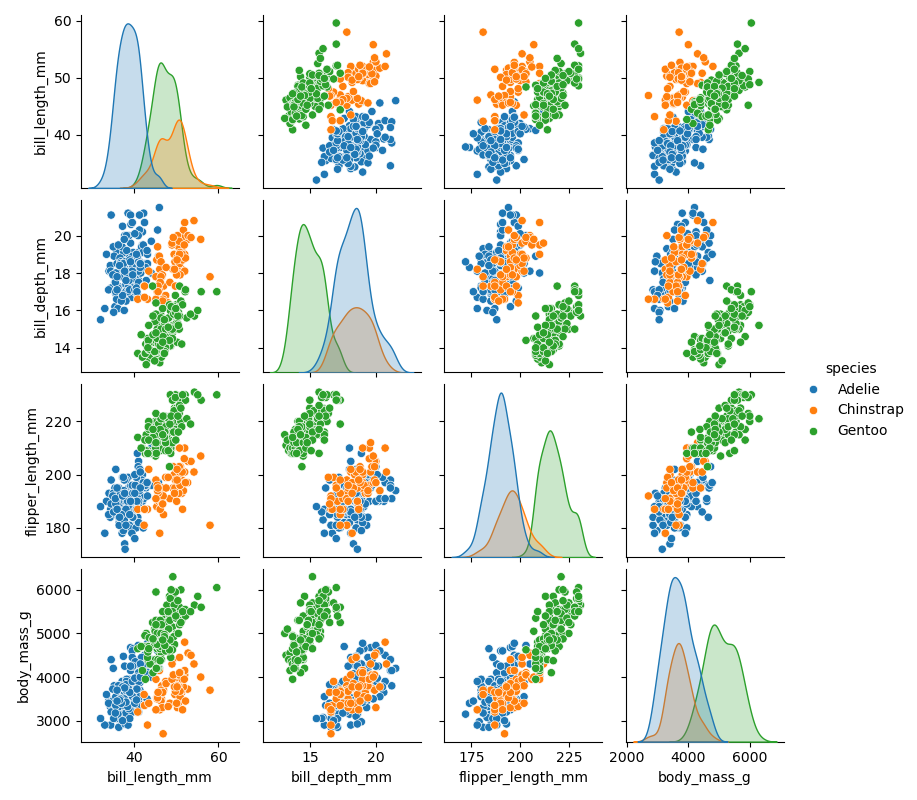

In [1]:
from IPython.display import display, Image
display(Image("../images/regression/penguins-pairplot.png", width=1024))

Depending on model construction approach, there are a variety of regression algorithms, ranging from simple, interpretable methods to more complex, flexible ones.
- **kNN regression**
    - predictions are made based on average of closest training samples.
    - this non-parametric, instance-based model captures local patterns in data effectively.
- **Linear models**
    - standard **linear regression** and **regularized regression** assume a straight-line relationship between feature and label.
    - these models are interpretable and efficient, providing a solid baseline for comparison.
- **Non-linear models**
    - to account for possible non-linear trends, we include **polynomial regression** with higher-degree terms and SVR with `rbf` kernels, which can model more complex relationships.
- **Tree-based models**
    - **decision trees**, **random forests**, and **gradient boosting** offer robust alternatives by recursively partitioning feature space or combining ensembles to improve accuracy and handle non-linearities effectively.
- **Neural networks**
    - these serve as universal function approximators, capable of learning intricate patterns in data, but typically require larger datasets and more computational resources.

Each model’s performance is assessed using cross-validated metrics such as **Root Mean Squared Error** (RMSE) and **R²** scores.
Resulting predictive curves illustrate how well each model captures relationship between features and labels

### 1.2 Palmer Penguins dataset

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# load dataset
penguins = sns.load_dataset('penguins')

# remove missing values and outliers
penguins_regression = penguins.dropna()

# check duplicate values
penguins_regression.duplicated().value_counts()

We follow the same procedures as addressed in previous episodes to handle missing values and outliers in the Penguins dataset.
For the regression task, only the ``flipper_length_mm`` and ``body_mass_g`` are used, with the former serving as the feature and the latter as the label.
Below is the code script to extract them from the main dataset.

In [ ]:
# 1st perform feature scaling, 2nd splitting data
# `inverse_transform()` method reverts transformed data back to its original scale or format

# features & labels
X = penguins_regression[["flipper_length_mm"]].values
y = penguins_regression["body_mass_g"].values

In this episode, we first perform feature scaling, followed by splitting the data into training and testing sets.
The `inverse_transform()` method reverts transformed data back to its original scale or format.

In [ ]:
# standardize feature and label
from sklearn.preprocessing import StandardScaler
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_scaled = scaler_X.fit_transform(X)
y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

# split training and testing sets
from sklearn.model_selection import train_test_split
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=123)

X_train_orig = scaler_X.inverse_transform(X_train_scaled).ravel()
X_test_orig = scaler_X.inverse_transform(X_test_scaled).ravel()
y_train_orig = scaler_y.inverse_transform(y_train_scaled.reshape(-1, 1)).ravel()
y_test_orig = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1)).ravel()

print(f"Number of examples for training is {len(X_train_scaled)} and test is {len(X_test_scaled)}")

Number of examples for training is 266 and test is 67


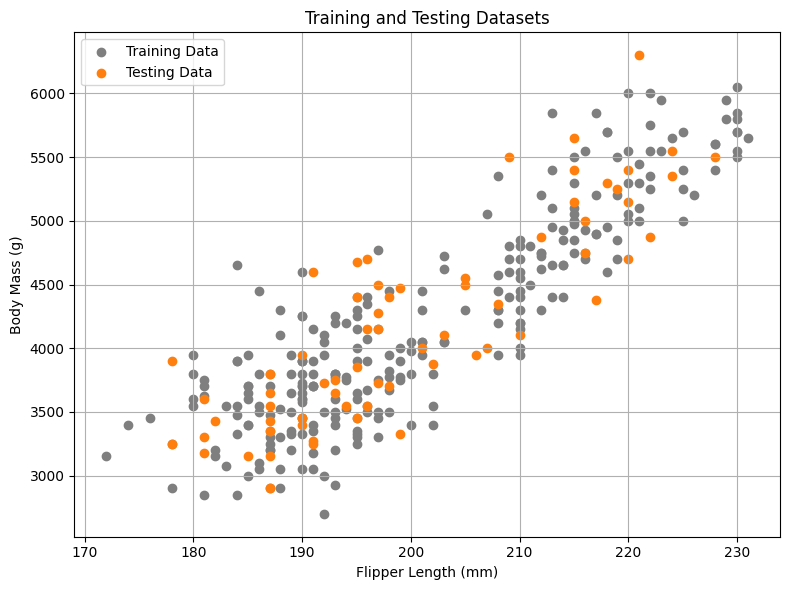

In [4]:
plt.figure(figsize=(8, 6))

plt.scatter(X_train_orig, y_train_orig, color="tab:gray", label="Training Data", alpha=1.0)
plt.scatter(X_test_orig, y_test_orig, color="tab:orange", label="Testing Data", alpha=1.0)

plt.xlabel("Flipper Length (mm)")
plt.ylabel("Body Mass (g)")
plt.title("Training and Testing Datasets")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()

## 2. kNN

We begin by applying the kNN algorithm to the penguin regression task, as illustrated in the code example below.

### 2.1 Fitting model and evaluating model's performance

In [5]:
from sklearn.neighbors import KNeighborsRegressor

knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train_scaled, y_train_scaled)

# predict on test data
knn_y_pred_scaled = knn_model.predict(X_test_scaled)
knn_y_pred = scaler_y.inverse_transform(knn_y_pred_scaled.reshape(-1, 1)).ravel()

For regression task, we use RMSE and R² score as evaluation metrics.
- **RMSE** measures average magnitude of prediction errors, providing insight into how closely model’s predictions match actual values.
- **R²** score indicates proportion of variance in target variable that is explained by model, reflecting its overall goodness of fit.

In [6]:
# evaluate model performance
from sklearn.metrics import root_mean_squared_error, r2_score

knn_rmse = root_mean_squared_error(y_test_orig, knn_y_pred)
knn_r2_value = r2_score(y_test_orig, knn_y_pred)
print(f"k-Nearest Neighbors RMSE: {knn_rmse:.2f}, R²: {knn_r2_value:.2f}")

k-Nearest Neighbors RMSE: 444.09, R²: 0.68


To visualize kNN algorithm for regression task, we plot **predictive curve**, which maps input values to predicted outputs
- this curve illustrates how kNN responds to changes in a single feature
- since kNN is a non-parametric, instance-based method, it does not learn a fixed equation during training
- instead, predictions are made by averaging target values of *k* nearest training examples for each input
- resulting predictive curve is typically piecewise-smooth, adapting to local patterns in data
- curve may bend or flatten depending on regions where data points are dense or sparse
- this makes predictive curve an especially useful tool for assessing whether kNN is underfitting (*e.g.*, when *k* is large) or overfitting (e.g., when *k* is small).
- by adjusting *k* and observing changes in curve’s shape, we can intuitively tune model’s **bias-variance tradeoff**.

<div class='alert alert-info'>

:::{callout} **Bias-variance tradeoff**
:class: dropdown

- Bias-variance tradeoff is a fundamental concept in ML that describes balance between model simplicity and model flexibility when trying to make accurate predictions.
- Bias measures how much a model’s predictions systematically differ from true values. High bias means model is too simple and cannot capture underlying patterns in data, which leads to underfitting.
- Variance measures how much a model’s predictions change when trained on different datasets. High variance means model is too sensitive to small fluctuations in training data, which leads to overfitting.
:::
</div>

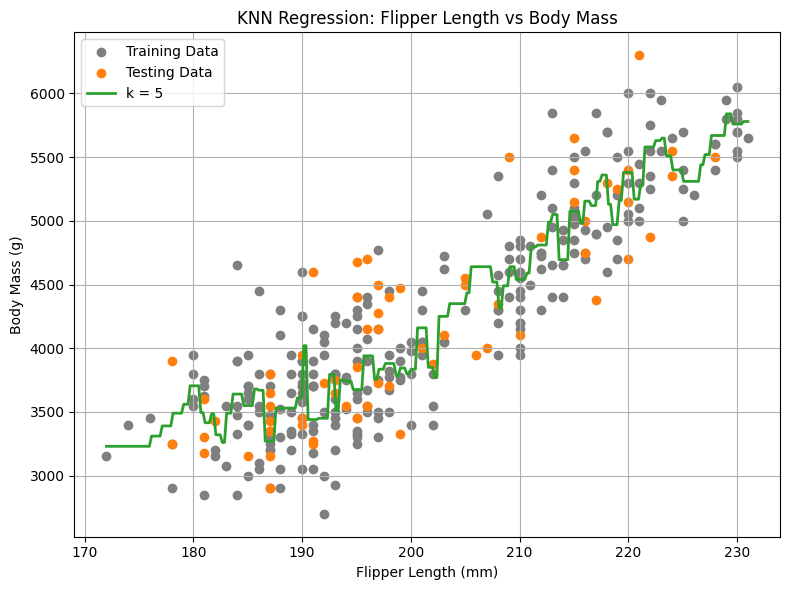

In [7]:
# using all predictions to plot regression curve

X_range = np.linspace(X.min(), X.max(), 300).reshape(-1, 1)
X_range_scaled = scaler_X.transform(X_range)
y_range_scaled = knn_model.predict(X_range_scaled).flatten()
y_range = scaler_y.inverse_transform(y_range_scaled.reshape(-1, 1)).ravel()

plt.figure(figsize=(8, 6))

plt.scatter(X_train_orig, y_train_orig, color="tab:gray", label="Training Data", alpha=1.0)
plt.scatter(X_test_orig, y=y_test_orig, color="tab:orange", label="Testing Data", alpha=1.0)

plt.plot(X_range, y_range, color='tab:green', label=f"k = {5}", linewidth=2)

plt.xlabel("Flipper Length (mm)")
plt.ylabel("Body Mass (g)")
plt.title("KNN Regression: Flipper Length vs Body Mass")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()

<div class="alert alert-warning">

:::{warning}
In kNN, choice of *k* (number of neighbors considered for prediction) is crucial
- if *k* is too small, model may rely on very few points, which can make predictions unstable or overly sensitive to small changes in dataset
- if *k* is too large, model considers too many points, which can smooth out important differences between regions of data and reduce prediction accuracy
- it is important to choose a *k* value that balances these effects, often by testing several values and selecting one that performs best on validation data
:::
</div>

### 2.2 Choosing K: Accuracy vs. number of neighbors

In [8]:
k_values = range(3, 22, 2)
temp_rmse_scores = []

for k in k_values:
    temp_model = KNeighborsRegressor(n_neighbors=k)
    temp_model.fit(X_train_scaled, y_train_scaled)
    temp_y_pred = temp_model.predict(X_test_scaled)
    temp_rmse = root_mean_squared_error(y_test_orig, temp_y_pred)
    temp_rmse_scores.append(temp_rmse)

print(f"RMSE Scores: {temp_rmse_scores}")

RMSE Scores: [4256.963127277994, 4257.016754755444, 4256.987122787979, 4256.987805769753, 4256.992361879016, 4256.994291607347, 4256.981428110867, 4256.980164902459, 4256.983237297148, 4256.98820237849]


### 2.3 Choosing optimal K using cross-validation method

In [9]:
from sklearn.model_selection import cross_val_score

cv_rmse_scores = []

for k in k_values:
    temp_model = KNeighborsRegressor(n_neighbors=k)
    scores = cross_val_score(temp_model, X, y, cv=5, scoring='neg_mean_squared_error')
    rmse = np.mean(np.sqrt(-scores))
    cv_rmse_scores.append(rmse)

print("Cross-validation RMSE scores:", cv_rmse_scores)

best_k = k_values[np.argmin(cv_rmse_scores)]
print("Best K:", best_k)

Cross-validation RMSE scores: [449.3829013294662, 421.41263376699135, 413.01571311321584, 413.09755853702325, 406.05657631311874, 404.0028419317068, 400.0633376883778, 395.7407184997919, 397.842065440562, 397.63947248594667]
Best K: 17


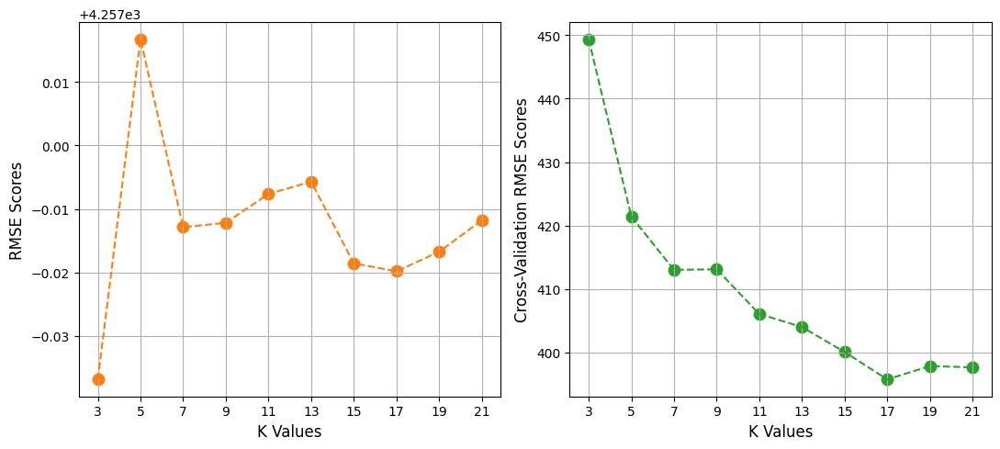

In [10]:
# data visualization

fig, axes = plt.subplots(1, 2, figsize=(11, 5))

# left: Accuracy vs. number of neighbors
axes[0].scatter(k_values, temp_rmse_scores, c="tab:orange", s=80)
axes[0].plot(k_values, temp_rmse_scores, linestyle="--", color="tab:orange")
axes[0].grid()
axes[0].set_xticks(k_values)
axes[0].set_xlabel("K Values", fontsize=12)
axes[0].set_ylabel("RMSE Scores", fontsize=12)

# right: cross-validation accuracy
axes[1].scatter(k_values, cv_rmse_scores, c="tab:green", s=80, label="Cross-Validation")
axes[1].plot(k_values, cv_rmse_scores, linestyle="--", color="tab:green")
axes[1].grid()
axes[1].set_xticks(k_values)
axes[1].set_xlabel("K Values", fontsize=12)
axes[1].set_ylabel("Cross-Validation RMSE Scores", fontsize=12)

plt.tight_layout()
plt.show()

## 3. Linear Regression

**Linear regression** is a fundamental and interpretable alternative model
- while KNN makes predictions based on average mass of most similar observations, linear regression aims to identify a single, global linear relationship between two variables
- this approach fits a straight line through data that minimizes overall prediction error, producing a model that is typically less computationally intensive and offers immediate insight into underlying trend
- core concept of this linear model is a simple equation
	- $y = w * x + b$
	- coefficient $w$ and intercept $b$
- fitted values of $w$ and $b$ can be accessed via `model.coef_` and `model.intercept_`

### 3.1 Fitting model

In [11]:
from sklearn.linear_model import LinearRegression

linear_model = LinearRegression()
linear_model.fit(X_train_scaled, y_train_scaled)
print(linear_model.coef_, linear_model.intercept_)

linear_y_pred_scaled = linear_model.predict(X_test_scaled)
linear_y_pred = scaler_y.inverse_transform(linear_y_pred_scaled.reshape(-1, 1)).ravel()

linear_rmse = root_mean_squared_error(y_test_orig, linear_y_pred)
linear_r2_value = r2_score(y_test_orig, linear_y_pred)
print(f"Linear Regression RMSE: {linear_rmse:.2f}, R²: {linear_r2_value:.2f}")

[0.87318095] -0.007137071569404985
Linear Regression RMSE: 411.85, R²: 0.72


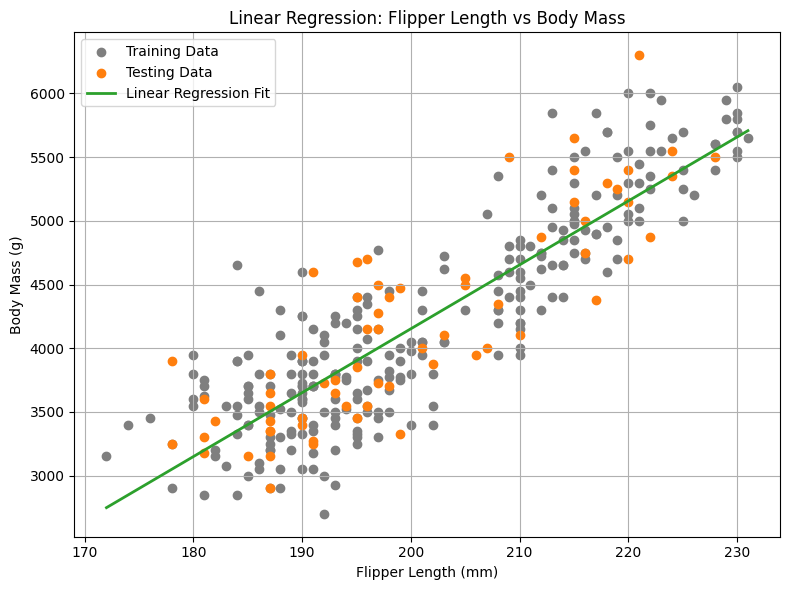

In [12]:
# using all predictions to plot regression curve

linear_y_range_scaled = linear_model.predict(X_range_scaled).flatten()
linear_y_range = scaler_y.inverse_transform(linear_y_range_scaled.reshape(-1, 1)).ravel()

plt.figure(figsize=(8, 6))

plt.scatter(X_train_orig, y_train_orig, color="tab:gray", label="Training Data", alpha=1.0)
plt.scatter(X_test_orig, y=y_test_orig, color="tab:orange", label="Testing Data", alpha=1.0)

plt.plot(X_range, linear_y_range, color='tab:green', label="Linear Regression Fit", linewidth=2)

plt.xlabel("Flipper Length (mm)")
plt.ylabel("Body Mass (g)")
plt.title("Linear Regression: Flipper Length vs Body Mass")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()

### 3.2 Residual analysis

While metrics like RMSE and R² score provide a high-level summary of model performance, **residual analysis** allows us to examine model more deeply and verify key assumptions of linear regression, ensuring that its conclusion is valid and reliable
- residuals are differences between predicted values and true values
- figure below, we can see that residuals are randomly scattered around zero, with no apparent systematic patterns
	- this indicates that linear model is largely unbiased and effectively captures main trend between feature and label

<div class='alert alert-info'>

If we notice certain patterns, *i.e.*, residuals that consistently increase or decrease with feature values, it suggests that relationship between feature and label might not be purely linear
- similarly, if residuals fan out, showing greater spread at higher predicted values, it indicates heteroscedasticity, meaning model errors are not consistent across range of predictions
	- such patterns imply that a simple linear regression model may not fully capture variability in lable
</div>

Another key aspect of residual analysis involves assessing normality, as Linear Regression assumes normally distributed residuals for reliable inference.
For the Penguins dataset, this can be evaluated using a histogram of the residuals, which illustrates the distribution of prediction errors across the dataset. 
In the Penguins dataset, these residuals should form a roughly symmetric, bell-shaped curve centered at zero.
This indicates that the model is not systematically over-predicting or under-predicting body mass, and that most errors are relatively small, with fewer large deviations.

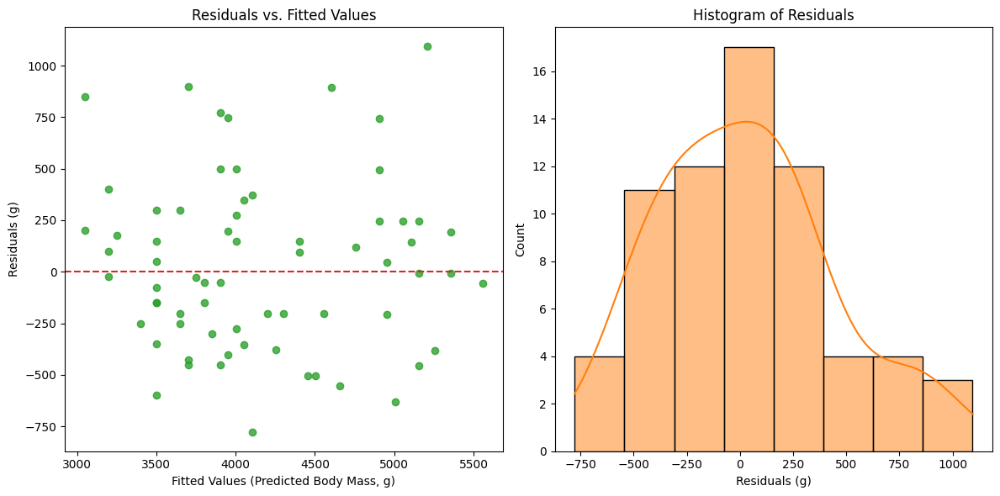

In [13]:
from scipy import stats

# calculate residuals
residuals = y_test_orig - linear_y_pred

plt.figure(figsize=(12, 6))

# left: residuals vs. fitted values
plt.subplot(1, 2, 1)
plt.scatter(linear_y_pred, residuals, alpha=0.8, color='tab:green')
plt.axhline(y=0, color='tab:red', linestyle='--')
plt.xlabel('Fitted Values (Predicted Body Mass, g)')
plt.ylabel('Residuals (g)')
plt.title('Residuals vs. Fitted Values')

# right: histogram of residuals
plt.subplot(1, 2, 2)
sns.histplot(residuals, kde=True, color='tab:orange')
plt.xlabel('Residuals (g)')
plt.title('Histogram of Residuals')

plt.tight_layout()
plt.show()

### 3.3 Gradient search

Linear regression algorithm predicts target variable *y* using two parameters: intercept ($b$) and slope ($w$)
- evaluate how well a particular choice of $b$ and $w$ fits data, we use a **loss function** to quantify difference between model’s predictions and actual observed values
- loss function serves as a numerical measure of model performance --- if predictions are close to true target values, loss will be small; if they are far apart, loss will be large
- loss function provides a systematic way to compare different parameter choices and guide learning process toward best-fitting model

For regression tasks, a common choice of loss function is **Mean Squared Error** (MSE)
- MSE measures measures average squared difference between true target values and predicted values
- MSE loss function is expressed as
	- $L(w, b) = \frac{1}{n}\sum_{i=1}^n(y_i - (w × x_i + b))^2$
- from formula, we can see that a smaller value of MSE loss indicates a better fit, meaning regression line lies closer to actual data points
- to find optimal values of $w$ and $b$ that minimize this loss, we can use **gradient-based search**
    - this method iteratively updates these two parameters so as to minimize loss function

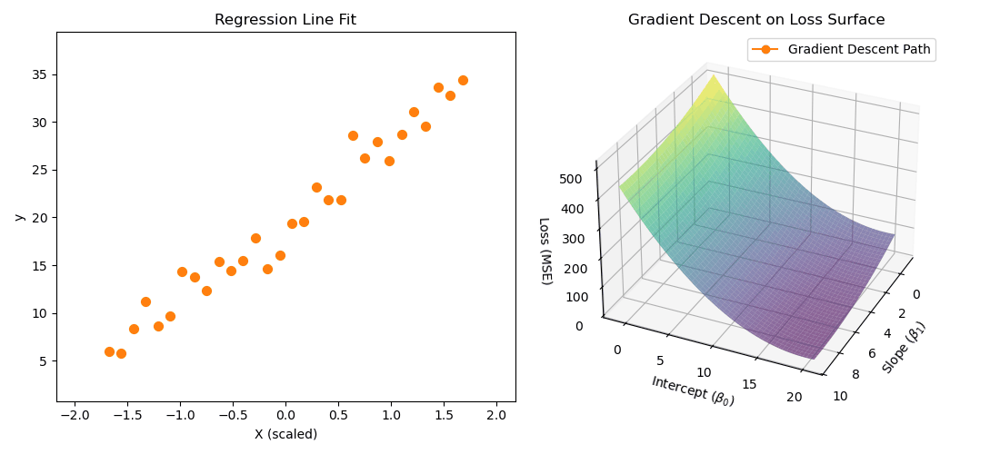

In [2]:
from IPython.display import display, Image
display(Image("../images/regression/stochastic-gradient-descent.gif", width=1240))

### 3.4 Evaluating model's performance on training and testing datasets

We evaluated linear regression model on testing dataset and calculated metrics such as RMSE and R² to understand its predictive performance
- while this gives a good indication of how well this model generalizes to unseen data, it only tells half story 
- to get a complete picture, it is important to also assess this model’s performance on training dataset and compare it with testing results
- this comparison is primary diagnostic tool for identifying a model's fundamental flaw
	- whether it is learning underlying signal or merely memorizing data
- by calculating performance metrics like RMSE and R² for both training and testing datasets, we can identify potential issues such as overfitting and underfitting
    - **overfitting** occurs when model performs extremely well on training data but poorly on testing data
    	- this indicates that model has memorized training patterns, including noise, rather than capturing true underlying relationship
    - **underfitting** happens when model performs poorly on both training and testing datasets, suggesting that it is too simple to capture relevant trends in data

In [14]:
# training data

y_pred_train_scaled = linear_model.predict(X_train_scaled)
y_pred_train = scaler_y.inverse_transform(y_pred_train_scaled.reshape(-1, 1)).ravel()

linear_rmse_train = root_mean_squared_error(y_train_orig, y_pred_train)
linear_r2_train = r2_score(y_train_orig, y_pred_train)
print(f"Linear Regression (Train) RMSE: {linear_rmse_train:.2f}, R²: {linear_r2_train:.2f}")

# testing data
y_pred_test_scaled = linear_model.predict(X_test_scaled)
y_pred_test = scaler_y.inverse_transform(y_pred_test_scaled.reshape(-1, 1)).ravel()

linear_rmse_test = root_mean_squared_error(y_test_orig, y_pred_test)
linear_r2_test = r2_score(y_test_orig, y_pred_test)
print(f"Linear Regression (Test)  RMSE: {linear_rmse_test:.2f}, R²: {linear_r2_test:.2f}")

Linear Regression (Train) RMSE: 387.10, R²: 0.77
Linear Regression (Test)  RMSE: 411.85, R²: 0.72


The trained Linear Regression model for predicting penguin body mass based on flipper length in the penguins dataset achieves comparable RMSE and R² scores on both the training and testing datasets, indicating a fairly good model.

### 3.5 Regularized regression (Ridge & Lasso)

To address overfitting and underfitting, regularized regression methods, such as **Ridge** and **Lasso** regression, extend linear regression by adding a penalty term to standard cost function
- this penalty discouragesmodel from relying too heavily on any single feature or from becoming overly complex by forcing coefficient values to be small
- **Ridge Regression** (L2 regularization) shrinks coefficients towards zero but never entirely eliminates them, which is highly effective for handling correlated features and improving stability
    - this is common in penguins dataset when predictors like flipper length and bill length are correlated
    - $Loss = MSE + \alpha \sum_i \beta_i^2$
- **Lasso Regression** (L1 regularization) can drive some coefficients to exactly zero, effectively performing automatic feature selection and creating a simpler, more interpretable model
    - *i.e.*, Lasso might retain flipper length while discarding less predictive features, improving generalization
    - $Loss = MSE + \alpha \sum_i |\beta_i|$
- by applying these regularization techniques, model can achieve a better balance between bias and variance, improving its ability to generalize to unseen data

In [15]:
from sklearn.linear_model import Ridge

ridge_model = Ridge(alpha=20.0)
ridge_model.fit(X_train_scaled, y_train_scaled)
print(ridge_model.coef_, ridge_model.intercept_)

ridge_y_pred_scaled = ridge_model.predict(X_test_scaled)
ridge_y_pred = scaler_y.inverse_transform(ridge_y_pred_scaled.reshape(-1, 1)).ravel()

ridge_rmse = root_mean_squared_error(y_test_orig, ridge_y_pred)
ridge_r2_value = r2_score(y_test_orig, ridge_y_pred)
print(f"Regularized Regression (Ridge) RMSE: {ridge_rmse:.2f}, R²: {ridge_r2_value:.2f}")

[0.81361728] -0.006180447493939291
Regularized Regression (Ridge) RMSE: 414.18, R²: 0.72


In [16]:
from sklearn.linear_model import Lasso

lasso_model = Lasso(alpha=0.2)
lasso_model.fit(X_train_scaled, y_train_scaled)
print(lasso_model.coef_, lasso_model.intercept_)

lasso_y_pred_scaled = lasso_model.predict(X_test_scaled)
lasso_y_pred = scaler_y.inverse_transform(lasso_y_pred_scaled.reshape(-1, 1)).ravel()

lasso_rmse = root_mean_squared_error(y_test_orig, lasso_y_pred)
lasso_r2_value = r2_score(y_test_orig, lasso_y_pred)
print(f"Regularized Regression (Lasso) RMSE: {lasso_rmse:.2f}, R²: {lasso_r2_value:.2f}")

[0.67844643] -0.004009532229640825
Regularized Regression (Lasso) RMSE: 437.19, R²: 0.69


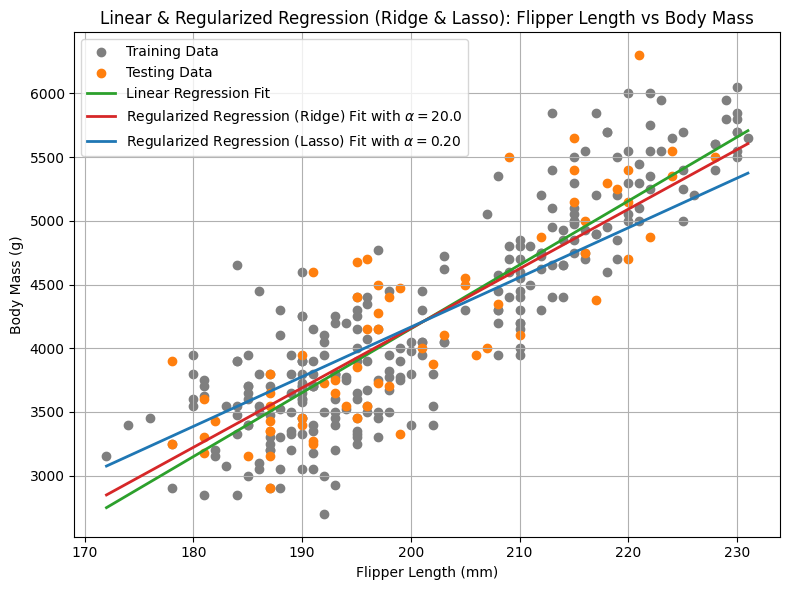

In [17]:
# using all predictions to plot regression curve

ridge_y_range_scaled = ridge_model.predict(X_range_scaled).flatten()
ridge_y_range = scaler_y.inverse_transform(ridge_y_range_scaled.reshape(-1, 1)).ravel()

lasso_y_range_scaled = lasso_model.predict(X_range_scaled).flatten()
lasso_y_range = scaler_y.inverse_transform(lasso_y_range_scaled.reshape(-1, 1)).ravel()

plt.figure(figsize=(8, 6))
plt.scatter(X_train_orig, y_train_orig, color="tab:gray", label="Training Data", alpha=1.0)
plt.scatter(X_test_orig, y_test_orig, color="tab:orange", label="Testing Data", alpha=1.0)

plt.plot(X_range, linear_y_range, color='tab:green', linewidth=2, label="Linear Regression Fit")
plt.plot(X_range, ridge_y_range,  color='tab:red',   linewidth=2, label=r"Regularized Regression (Ridge) Fit with $\alpha=20.0$")
plt.plot(X_range, lasso_y_range,  color='tab:blue',  linewidth=2, label=r"Regularized Regression (Lasso) Fit with $\alpha=0.20$")

plt.xlabel("Flipper Length (mm)")
plt.ylabel("Body Mass (g)")
plt.title("Linear & Regularized Regression (Ridge & Lasso): Flipper Length vs Body Mass")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()

In [18]:
print("Comparison of fitting parameters:")
print(f"Linear      Regression         fitting parameters: slope = {linear_model.coef_[0]:.4f} and intercept = {linear_model.intercept_:.6f}")
print(f"Regularized Regression (Ridge) fitting parameters: slope = {ridge_model.coef_[0]:.4f} and intercept = {ridge_model.intercept_:.6f}")
print(f"Regularized Regression (Lasso) fitting parameters: slope = {lasso_model.coef_[0]:.4f} and intercept = {lasso_model.intercept_:.6f}")

print("\nComparison of RMSE and R² values:")
print(f"Linear      Regression         RMSE: {linear_rmse:.2f}, R²: {linear_r2_value:.2f}")
print(f"Regularized Regression (Ridge) RMSE: {ridge_rmse:.2f}, R²: {ridge_r2_value:.2f}")
print(f"Regularized Regression (Lasso) RMSE: {lasso_rmse:.2f}, R²: {lasso_r2_value:.2f}")

Comparison of fitting parameters:
Linear      Regression         fitting parameters: slope = 0.8732 and intercept = -0.007137
Regularized Regression (Ridge) fitting parameters: slope = 0.8136 and intercept = -0.006180
Regularized Regression (Lasso) fitting parameters: slope = 0.6784 and intercept = -0.004010

Comparison of RMSE and R² values:
Linear      Regression         RMSE: 411.85, R²: 0.72
Regularized Regression (Ridge) RMSE: 414.18, R²: 0.72
Regularized Regression (Lasso) RMSE: 437.19, R²: 0.69


Application of Ridge Regression on Penguins dataset may not be immediately intuitive
- we apply it to a synthetic dataset with different $\alpha$ values and then compare results with those obtained from linear regression
- <mark>tutorial</mark>

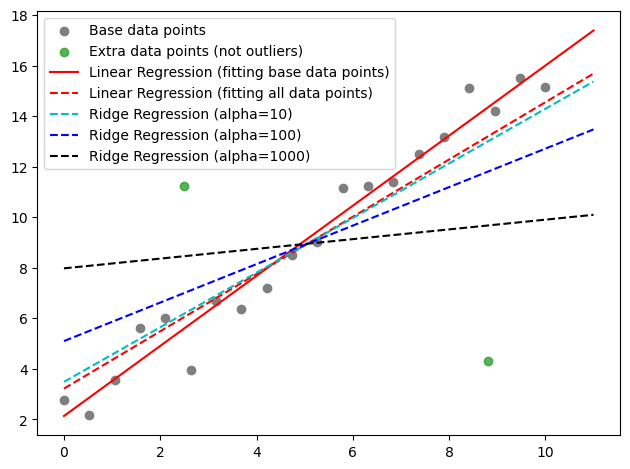

In [3]:
display(Image("../images/regression/linear-regression-ridge-on-synthetic-data.png", width=1240))

## 4. Polynomial Regression

In previous section, we assumed that label is linearly proportional to feature, and after training, we have verified that this assumption holds reasonably well
- however, for other applications, if two variables are explicitly not linearly related, and a simple linear model may fail to capture underlying patterns
- in such cases, we can resort to **Polynomial Regression** to capture non-linear relationship by including higher-degree terms of predictor variable
- polynomial regression extends linear regression by modeling label as a polynomial function of feature with formula listed below
	- $y = b + w_1*x_1 + w_2*x_1^2 + ... + w_d*x_1^d$
- process of training a polynomial regression model is similar to linear regression
	- 1st transform original feature by adding polynomial terms (*e.g.*, $x^2$ and higher-degree terms), creating a feature matrix that polynomial regression model uses to fit a non-linear curve while still employing linear regression techniques on transformed features

### 4.1 Fitting model and evaluating model's performance

In [19]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

degree3=3
poly3_model = make_pipeline(PolynomialFeatures(degree3), LinearRegression())
poly3_model.fit(X_train_scaled, y_train_scaled)
print(poly3_model.named_steps['linearregression'].coef_, poly3_model.named_steps['linearregression'].intercept_)

poly3_y_pred_scaled = poly3_model.predict(X_test_scaled)
poly3_y_pred = scaler_y.inverse_transform(poly3_y_pred_scaled.reshape(-1, 1)).ravel()

poly3_rmse = root_mean_squared_error(y_test_orig, poly3_y_pred)
poly3_r2_value = r2_score(y_test_orig, poly3_y_pred)
print(f"Polynomial Regression (degree={degree3}) RMSE: {poly3_rmse:.2f}, R²: {poly3_r2_value:.2f}")

[ 0.          0.94465524  0.17823342 -0.06719099] -0.16346920517391375
Polynomial Regression (degree=3) RMSE: 407.47, R²: 0.73


In [20]:
degree5=5
poly5_model = make_pipeline(PolynomialFeatures(degree5), LinearRegression())
poly5_model.fit(X_train_scaled, y_train_scaled)
print(poly5_model.named_steps['linearregression'].coef_, poly5_model.named_steps['linearregression'].intercept_)

poly5_y_pred_scaled = poly5_model.predict(X_test_scaled)
poly5_y_pred = scaler_y.inverse_transform(poly5_y_pred_scaled.reshape(-1, 1)).ravel()

poly5_rmse = root_mean_squared_error(y_test_orig, poly5_y_pred)
poly5_r2_value = r2_score(y_test_orig, poly5_y_pred)
print(f"Polynomial Regression (degree={degree5}) RMSE: {poly5_rmse:.2f}, R²: {poly5_r2_value:.2f}")

[ 0.          0.92465516  0.36156078 -0.0626784  -0.05545389  0.00535874] -0.243188187401872
Polynomial Regression (degree=5) RMSE: 415.55, R²: 0.72


Compared with linear regression, we see that a 3rd-degree polynomial regression model provides a marginally better fit than simple linear model
- below we present predictive curves for polynomial regression models with degrees 3 and 5, alongside curve for linear regression
- in addition, we report evaluation metrics (RMSE and R²) on testing dataset to provide a quantitative comparison

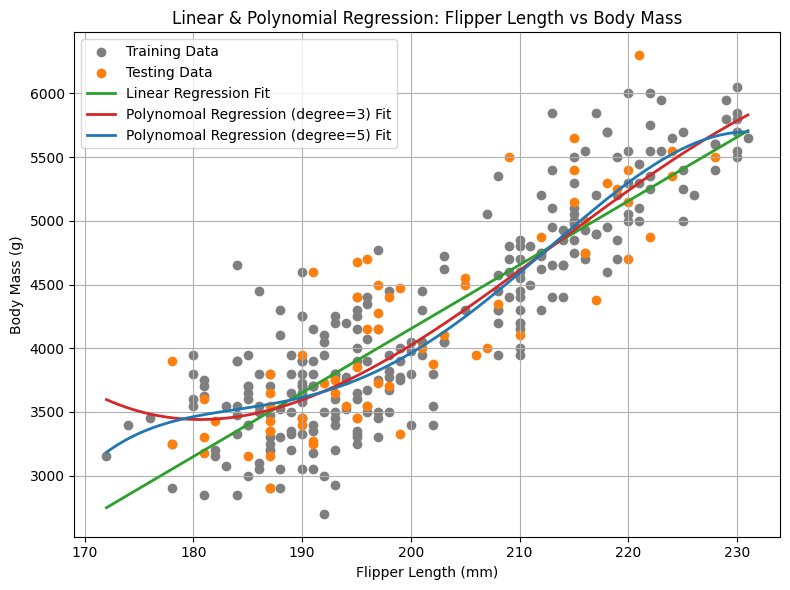

In [21]:
# using all predictions to plot regression curve

poly3_y_range_scaled = poly3_model.predict(X_range_scaled).flatten()
poly3_y_range = scaler_y.inverse_transform(poly3_y_range_scaled.reshape(-1, 1)).ravel()

poly5_y_range_scaled = poly5_model.predict(X_range_scaled).flatten()
poly5_y_range = scaler_y.inverse_transform(poly5_y_range_scaled.reshape(-1, 1)).ravel()

plt.figure(figsize=(8, 6))

plt.scatter(X_train_orig, y_train_orig, color="tab:gray", label="Training Data", alpha=1.0)
plt.scatter(X_test_orig, y_test_orig, color="tab:orange", label="Testing Data", alpha=1.0)

plt.plot(X_range, linear_y_range, color='tab:green', linewidth=2, label="Linear Regression Fit")
plt.plot(X_range, poly3_y_range, color='tab:red',  linewidth=2, label=f"Polynomoal Regression (degree={degree3}) Fit")
plt.plot(X_range, poly5_y_range, color='tab:blue', linewidth=2, label=f"Polynomoal Regression (degree={degree5}) Fit")

plt.xlabel("Flipper Length (mm)")
plt.ylabel("Body Mass (g)")
plt.title("Linear & Polynomial Regression: Flipper Length vs Body Mass")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()

In [22]:
print("Comparison of fitting parameters:")
print(f"Linear     Regression            fitting parameters: intercept = {ridge_model.intercept_:.4f} and slope = {linear_model.coef_}")
print(f"Polynomial Regression (degree=3) fitting parameters: intercept = {poly3_model.named_steps['linearregression'].intercept_:.4f} and slope = {poly3_model.named_steps['linearregression'].coef_}")
print(f"Polynomial Regression (degree=5) fitting parameters: intercept = {poly5_model.named_steps['linearregression'].intercept_:.4f} and slope = {poly5_model.named_steps['linearregression'].coef_}")

print("\nComparison of RMSE and R² values:")
print(f"Linear     Regression            RMSE: {linear_rmse:.2f}, R²: {linear_r2_value:.2f}")
print(f"Polynomial Regression (degree={degree3}) RMSE: {poly3_rmse:.2f}, R²: {poly3_r2_value:.2f}")
print(f"Polynomial Regression (degree={degree5}) RMSE: {poly5_rmse:.2f}, R²: {poly5_r2_value:.2f}")

Comparison of fitting parameters:
Linear     Regression            fitting parameters: intercept = -0.0062 and slope = [0.87318095]
Polynomial Regression (degree=3) fitting parameters: intercept = -0.1635 and slope = [ 0.          0.94465524  0.17823342 -0.06719099]
Polynomial Regression (degree=5) fitting parameters: intercept = -0.2432 and slope = [ 0.          0.92465516  0.36156078 -0.0626784  -0.05545389  0.00535874]

Comparison of RMSE and R² values:
Linear     Regression            RMSE: 411.85, R²: 0.72
Polynomial Regression (degree=3) RMSE: 407.47, R²: 0.73
Polynomial Regression (degree=5) RMSE: 415.55, R²: 0.72


<div class='alert alert-warning'>

:::{warning}
It is crucial to approach this added complexity with caution
- while higher-degree polynomials can achieve very close fits to training data, they are also highly prone to overfitting
- *i.e.*, a model with a very high degree (*e.g.*, degree = 10) may contort itself to pass through nearly every training point, capturing random noise rather than true underlying relationship
- as a result, such a model would likely perform poorly on unseen testing data, sacrificing generalizability for apparent short-term accuracy.
:::
</div>

### 4.2 Residual analysis

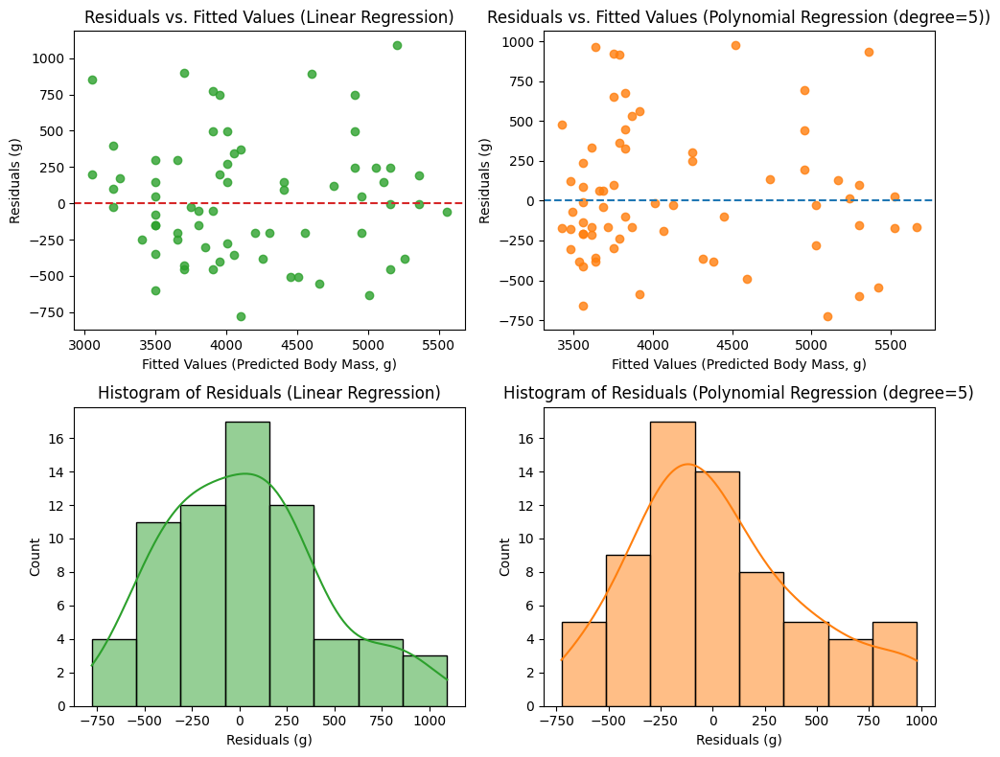

In [23]:
plt.figure(figsize=(10, 8))

# residuals vs. fitted values (linear)
residuals = y_test_orig - linear_y_pred
plt.subplot(2, 2, 1)
plt.scatter(linear_y_pred, residuals, alpha=0.8, color='tab:green')
plt.axhline(y=0, color='tab:red', linestyle='--')
plt.xlabel('Fitted Values (Predicted Body Mass, g)')
plt.ylabel('Residuals (g)')
plt.title('Residuals vs. Fitted Values (Linear Regression)')

# residuals vs. fitted values (polynomial regression)
plt.subplot(2, 2, 2)
residuals = y_test_orig - poly5_y_pred
plt.scatter(poly5_y_pred, residuals, alpha=0.8, color='tab:orange')
plt.axhline(y=0, color='tab:blue', linestyle='--')
plt.xlabel('Fitted Values (Predicted Body Mass, g)')
plt.ylabel('Residuals (g)')
plt.title('Residuals vs. Fitted Values (Polynomial Regression (degree=5))')

# histogram of residuals (linear regression)
residuals = y_test_orig - linear_y_pred
plt.subplot(2, 2, 3)
sns.histplot(residuals, kde=True, color='tab:green')
plt.xlabel('Residuals (g)')
plt.title('Histogram of Residuals (Linear Regression)')

# histogram of residuals (polynomial regression)
plt.subplot(2, 2, 4)
residuals = y_test_orig - poly5_y_pred
sns.histplot(residuals, kde=True, color='tab:orange')
plt.xlabel('Residuals (g)')
plt.title('Histogram of Residuals (Polynomial Regression (degree=5)')

plt.tight_layout()
plt.show()

<div class='alert alert-info'>

:::{note}
Additionally, residual analysis can provide further information on model performance.
- Compared with linear regression, polynomial regression model with degree = 5 shows signs of overfitting, as evidenced by systematic deviations in residuals and asymmetric distribution of prediction errors across dataset.
:::
</div>

Overall, polynomial regression serves as a simple yet powerful extension of linear regression
- it enables us to capture non-linear relationships while still benefiting from interpretability and computational efficiency of a linear framework applied to transformed features
- key challenge lies in selecting appropriate polynomial degree-
    - too low a degree may underfit data, missing important trends
    - too high a degree risks memorizing noise and overfitting
- to strike right balance, rigorous evaluation techniques --- such as cross-validation on training set --- are typically used to identify optimal degree, followed by a final assessment on testing set
- by carefully tuning complexity, polynomial regression can deliver genuine improvements in predictive accuracy and provide a more faithful representation of often non-linear patterns found in natural world

### 4.3 Complexity

## 5. Support Vector Regression (SVR)

In previous episode, we introduced SVM model, which is widely recognized for its effectiveness in classification tasks by finding an optimal hyperplane that maximizes margin between classes
- here, we adapt same principles to regression through **Support Vector Regression** (SVR)
- SVR aims to find a tube (or a channel) ($\epsilon$-insensitive zone) of a specified width that captures as many data points as possible, while only points lying outside this tube (support vector) affect model’s predictions
- core challenge SVR faces is that, by its fundamental nature, it seeks a linear relationship (a flat hyperplane)
- in many real-world problems, underlying relationship, while roughly linear, may contain subtle non-linear patterns that a straight line cannot fully capture
- rather than manually generating polynomial features, which can be computationally expensive and impractical in high-dimensional spaces, kernel functions are used to capture non-linear relationships by implicitly projecting (rather than explicitly transforming) input data into higher-dimensional feature spaces

<div class='alert alert-info'>

Several kernel types are commonly used in SVR, each imparting different characteristics to model
- **linear kernel** is simplest kernel, which does not perform any transformation and assumes a linear relationship between features and target variable
	- it is fast and interpretable but lacks flexibility for modeling complex patterns
- **polynomial kernel** enables model to fit polynomial curves of a specified degree $d$ with contronable flexibility
	- while more adaptable than a linear kernel, it can be sensitive to chosen degree and may perform poorly when extrapolating beyond the training range
- **radial basis function (rbf) kernel** is most widely used kernel for non-linear problems, capable of generating highly flexible and smooth curves
	- it is versatile and effective for capturing complex relationships in data
</div>

### 5.1 Fitting model and evaluating model's performance

For the penguin regression task, we use the RBF kernel in the SVR model to capture potential non-linear relationships between flipper length and body mass that a simple linear model might not be able to detect.

In [24]:
from sklearn.svm import SVR

svr_model = SVR(kernel='rbf', gamma=0.1, C=100.0, epsilon=1.0)
svr_model.fit(X_train_scaled, y_train_scaled)

svr_y_pred_scaled = svr_model.predict(X_test_scaled)
svr_y_pred = scaler_y.inverse_transform(svr_y_pred_scaled.reshape(-1, 1)).ravel()

svr_rmse = root_mean_squared_error(y_test_orig, svr_y_pred)
svr_r2_value = r2_score(y_test_orig, svr_y_pred)
print(f"Support Vector Regression RMSE: {svr_rmse:.2f}, R²: {svr_r2_value:.2f}")

Support Vector Regression RMSE: 433.30, R²: 0.69


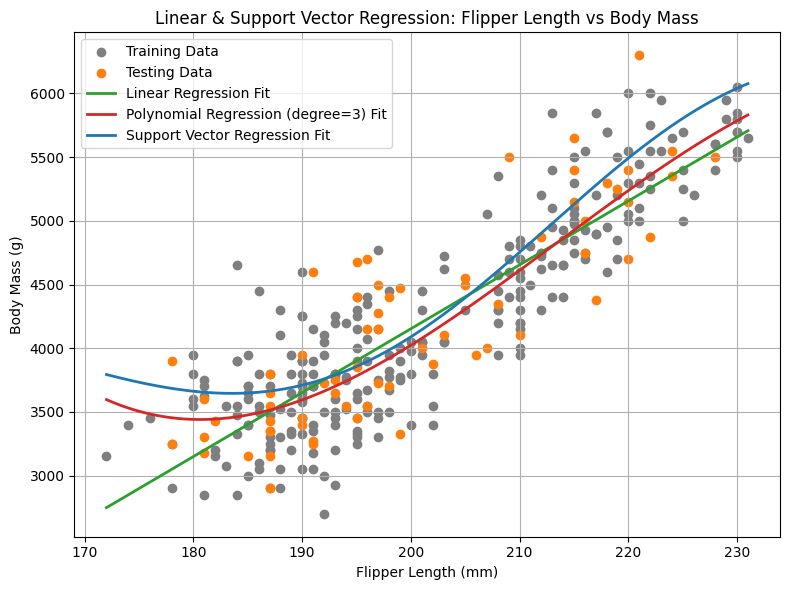

In [25]:
# using all predictions to plot regression curve

svr_y_range_scaled = svr_model.predict(X_range_scaled).flatten()
svr_y_range = scaler_y.inverse_transform(svr_y_range_scaled.reshape(-1, 1)).ravel()

plt.figure(figsize=(8, 6))

plt.scatter(X_train_orig, y_train_orig, color="tab:gray", label="Training Data", alpha=1.0)
plt.scatter(X_test_orig, y_test_orig, color="tab:orange", label="Testing Data", alpha=1.0)

plt.plot(X_range, linear_y_range, color='tab:green', linewidth=2, label="Linear Regression Fit")
plt.plot(X_range, poly3_y_range, color='tab:red', linewidth=2, label=f"Polynomial Regression (degree={degree3}) Fit")
plt.plot(X_range, svr_y_range, color='tab:blue', linewidth=2, label="Support Vector Regression Fit")

plt.xlabel("Flipper Length (mm)")
plt.ylabel("Body Mass (g)")
plt.title("Linear & Support Vector Regression: Flipper Length vs Body Mass")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()

In [26]:
print("\nComparison of RMSE and R² values:")
print(f"Linear     Regression            RMSE: {linear_rmse:.2f}, R²: {linear_r2_value:.2f}")
print(f"Polynomial Regression (degree={degree3}) RMSE: {poly3_rmse:.2f}, R²: {poly3_r2_value:.2f}")
print(f"Support Vector Regression        RMSE: {svr_rmse:.2f}, R²: {svr_r2_value:.2f}")


Comparison of RMSE and R² values:
Linear     Regression            RMSE: 411.85, R²: 0.72
Polynomial Regression (degree=3) RMSE: 407.47, R²: 0.73
Support Vector Regression        RMSE: 433.30, R²: 0.69


For Penguins dataset, SVR can potentially outperform Linear Regression if relationship between flipper length and body mass is non-linear, as it can flexibly adapt to complex patterns without requiring explicit polynomial features.
- However, in this regression task, SVR with a (non-linear) RBF kernel underperforms compared to Linear Regression model.
- There are two main reasons for this:
	- Relationship between flipper length and body mass is fundamentally linear or only mildly non-linear, so the flexibility of SVR is not necessary.
	- Hyperparameters (`gamma`, `C`, `epsilon` in `svr_model = SVR(kernel='rbf', gamma=0.1, C=100.0, epsilon=1.0)`) used for the SVR model may not be optimal.
- In this case, tuning hyperparameters using techniques like **grid search** or **cross-validation** could improve performance.

### 5.2 Tuning hyperparameters using grid search and cross-validation methods

**Grid search** is a systematic way to find good hyperparameters for a ML model by exhaustively trying all combinations from a predefined set and selecting one that gives best performance according to a chosen evaluation metric (usually via cross-validation).
- In SVR, hyperparameters strongly affect model behavior:
    - C (regularization strength): Controls the trade-off between model complexity and error on training data.
        - Large C → tries to fit training data closely (risk of overfitting)
        - Small C → smoother function (risk of underfitting)
    - gamma (for RBF kernel): Controls how far the influence of a single training example reaches.
        - Large gamma → very local influence, complex model
        - Small gamma → global influence, smoother model
    - epsilon: Defines the width of the ε-insensitive tube.
        - Large ε → ignores small errors, simpler model
        - Small ε → penalizes even small errors, more sensitive model
- **There is no closed-form rule to pick the best values, so we search.**

What grid search does conceptually
- Define a grid of possible values for each hyperparameter
- Enumerate all combinations
- For each combination:
    - Train an SVR model
    - Evaluate it using cross-validation
    - Select the combination that gives the best average validation score
- Hence the name grid search: **hyperparameter space is discretized into a grid**.
- Suppose we choose:
    - C ∈ {0.1, 1, 10}
    - γ ∈ {0.01, 0.1, 1}
    - ε ∈ {0.01, 0.1}
    - This leads to 18 models in total.
    - Each of these 18 models will be evaluated via cross-validation.

<div class='alert alert-warning'>

:::{callout} **Grid search** and **Cross validation**

Grid search is a method used to find the best combination of hyperparameters for a ML model. It will search all possible combinations of the hyperparameter values you specify, trains the model for each combination, and evaluates it using a validation set. After testing all combinations, it picks the set of hyperparameters that gives the best performance.

Cross-validation is a method to check how well a model will perform on unseen data.
- Instead of just splitting the data once into training and testing sets, cross-validation splits the data into several parts (folds).
- The model is trained on some folds and tested on the remaining fold. This process is repeated so that every fold gets a turn as the test set.
- The performance scores from all folds are averaged, giving a more reliable estimate of how the model will do in real situations.
- Here is a one example: The dataset is split into 5 parts. The model trains on 4 parts and tests on 1 part. This is repeated 5 times, each time with a different test part.
:::
</div>

In [27]:
from sklearn.model_selection import GridSearchCV

# define SVR model
svr_find_opt_model = SVR(kernel='rbf')

# define parameter grid
param_grid = {
    'C': [1, 10, 100, 1000],
    'gamma': [0.01, 0.1, 1, 10],
    'epsilon': [0.1, 0.5, 1.0]
}

# set up 5-fold cross-validation
grid_search = GridSearchCV(
    estimator=svr_find_opt_model,
    param_grid=param_grid,
    cv=5,  # 5-fold CV
    scoring='neg_root_mean_squared_error',  # RMSE
    verbose=2,
    n_jobs=-1
)

# fit grid search to training data
grid_search.fit(X_train_scaled, y_train_scaled)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


,estimator,SVR()
,param_grid,"{'C': [1, 10, ...], 'epsilon': [0.1, 0.5, ...], 'gamma': [0.01, 0.1, ...]}"
,scoring,'neg_root_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,5
,verbose,2
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,kernel,'rbf'


In [28]:
# Convert CV results to DataFrame
fitting_results = pd.DataFrame(grid_search.cv_results_)

# select relevant columns
cols = [
    'param_C',
    'param_gamma',
    'param_epsilon',
    'mean_test_score',
    'std_test_score'
]

fitting_results = fitting_results[cols]

# convert negative RMSE to positive RMSE
fitting_results['mean_CV_RMSE'] = -fitting_results['mean_test_score']
fitting_results['std_CV_RMSE'] = fitting_results['std_test_score']

print(fitting_results)

    param_C  param_gamma  param_epsilon  mean_test_score  std_test_score  \
0         1         0.01            0.1        -0.499983        0.025897   
1         1         0.10            0.1        -0.463875        0.028269   
2         1         1.00            0.1        -0.464917        0.025206   
3         1        10.00            0.1        -0.475266        0.030724   
4         1         0.01            0.5        -0.513013        0.038874   
5         1         0.10            0.5        -0.469555        0.025350   
6         1         1.00            0.5        -0.478235        0.027106   
7         1        10.00            0.5        -0.490480        0.029167   
8         1         0.01            1.0        -0.632248        0.076536   
9         1         0.10            1.0        -0.501307        0.043845   
10        1         1.00            1.0        -0.507105        0.030156   
11        1        10.00            1.0        -0.552476        0.043598   
12       10 

In [29]:
# sort by best RMSE
fitting_results = fitting_results.sort_values(by='mean_CV_RMSE')

# print all models
for _, row in fitting_results.iterrows():
    print(
        f"C={row['param_C']:6.1f}, "
        f"gamma={row['param_gamma']:4.1f}, "
        f"epsilon={row['param_epsilon']:3.1f} | "
        f"CV RMSE = {row['mean_CV_RMSE']:.4f} "
        f"(± {row['std_CV_RMSE']:.4f})"
    )

C=1000.0, gamma= 0.1, epsilon=0.1 | CV RMSE = 0.4610 (± 0.0237)
C= 100.0, gamma= 0.1, epsilon=0.1 | CV RMSE = 0.4618 (± 0.0249)
C=  10.0, gamma= 0.1, epsilon=0.1 | CV RMSE = 0.4635 (± 0.0288)
C=  10.0, gamma= 1.0, epsilon=0.1 | CV RMSE = 0.4637 (± 0.0243)
C=   1.0, gamma= 0.1, epsilon=0.1 | CV RMSE = 0.4639 (± 0.0283)
C=   1.0, gamma= 1.0, epsilon=0.1 | CV RMSE = 0.4649 (± 0.0252)
C= 100.0, gamma= 1.0, epsilon=0.1 | CV RMSE = 0.4659 (± 0.0245)
C=1000.0, gamma= 1.0, epsilon=0.1 | CV RMSE = 0.4685 (± 0.0255)
C=   1.0, gamma= 0.1, epsilon=0.5 | CV RMSE = 0.4696 (± 0.0253)
C=1000.0, gamma= 0.0, epsilon=0.1 | CV RMSE = 0.4696 (± 0.0314)
C= 100.0, gamma= 0.1, epsilon=0.5 | CV RMSE = 0.4697 (± 0.0247)
C=1000.0, gamma= 0.1, epsilon=0.5 | CV RMSE = 0.4699 (± 0.0212)
C=  10.0, gamma= 0.1, epsilon=0.5 | CV RMSE = 0.4700 (± 0.0253)
C= 100.0, gamma= 0.0, epsilon=0.1 | CV RMSE = 0.4718 (± 0.0292)
C= 100.0, gamma= 0.0, epsilon=0.5 | CV RMSE = 0.4719 (± 0.0249)
C=1000.0, gamma= 0.0, epsilon=0.5 | CV R

In [30]:
# best parameters and score
print("Best parameters found:", grid_search.best_params_)
print("Best CV RMSE:", -grid_search.best_score_)

Best parameters found: {'C': 1000, 'epsilon': 0.1, 'gamma': 0.1}
Best CV RMSE: 0.4609639426572684


In [31]:
# train final model with best parameters

svr_opt_model = grid_search.best_estimator_
svr_opt_model.fit(X_train_scaled, y_train_scaled)

svr_opt_y_pred_scaled = svr_opt_model.predict(X_test_scaled)
svr_opt_y_pred = scaler_y.inverse_transform(svr_opt_y_pred_scaled.reshape(-1, 1)).ravel()

svr_opt_rmse = root_mean_squared_error(y_test_orig, svr_opt_y_pred)
svr_opt_r2_value = r2_score(y_test_orig, svr_opt_y_pred)

print(f"Support Vector Regression       RMSE: {svr_rmse:.2f}, R²: {svr_r2_value:.2f}")
print(f"Support Vector Regression (OPT) RMSE: {svr_opt_rmse:.2f}, R²: {svr_opt_r2_value:.2f}")

Support Vector Regression       RMSE: 433.30, R²: 0.69
Support Vector Regression (OPT) RMSE: 421.54, R²: 0.71


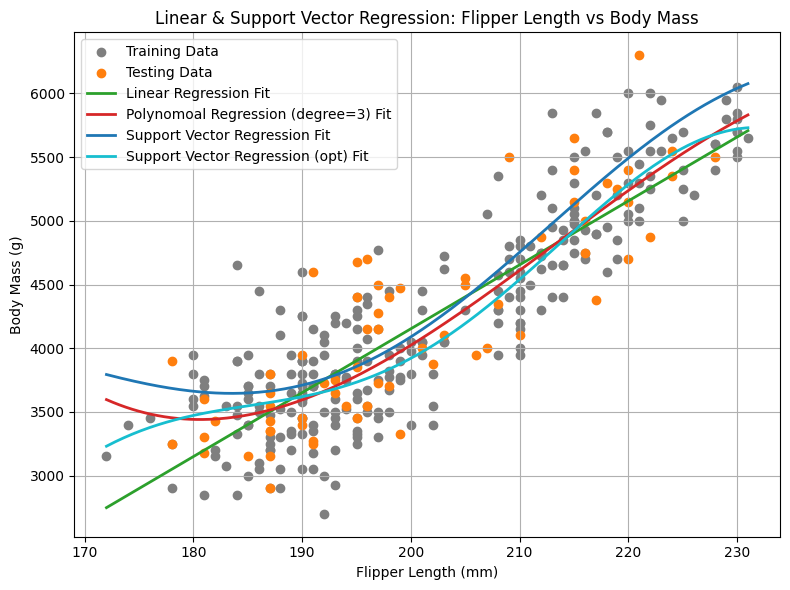

In [32]:
# using predictions from opt parameters to plot regression curve

svr_opt_y_range_scaled = svr_opt_model.predict(X_range_scaled).flatten()
svr_opt_y_range = scaler_y.inverse_transform(svr_opt_y_range_scaled.reshape(-1, 1)).ravel()

plt.figure(figsize=(8, 6))

plt.scatter(X_train_orig, y_train_orig, color="tab:gray", label="Training Data", alpha=1.0)
plt.scatter(X_test_orig, y_test_orig, color="tab:orange", label="Testing Data", alpha=1.0)

plt.plot(X_range, linear_y_range, color='tab:green', linewidth=2, label="Linear Regression Fit")
plt.plot(X_range, poly3_y_range, color='tab:red', linewidth=2, label=f"Polynomoal Regression (degree={degree3}) Fit")
plt.plot(X_range, svr_y_range, color='tab:blue', linewidth=2, label="Support Vector Regression Fit")
plt.plot(X_range, svr_opt_y_range, color='tab:cyan', linewidth=2, label="Support Vector Regression (opt) Fit")

plt.xlabel("Flipper Length (mm)")
plt.ylabel("Body Mass (g)")
plt.title("Linear & Support Vector Regression: Flipper Length vs Body Mass")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()

## 6. Tree-Based Methods

In addition to instance-based models such as kNN and margin-based models like SVR, we can also apply tree-based methods for regression task to predict a penguin's body mass from its flipper length.
- One of most intuitive and interpretable approaches in this family is **Decision Tree Regressor**.
    - A Decision Tree Regressor is a non-linear model that partitions feature space (flipper length) into distinct regions based on feature thresholds and assigns a constant value (average body mass) to each region.
- For penguin regression task, Decision Tree Regressor recursively splits dataset into groups of penguins with similar flipper lengths.
    - At each split, model selects threshold that minimize variance of body mass within resulting groups.
    - This recursive process continues until stopping criteria are met, such as reaching a maximum tree depth or a minimum number of samples per leaf.
- Below is a code example demonstrating two Decision Tree Regressors (`max_depth = 3` and `max_depth = 5`) applied to penguins regression task.

### 6.1 Decision Tree

In [33]:
from sklearn.tree import DecisionTreeRegressor

dt3_model = DecisionTreeRegressor(max_depth=3, random_state=123)
dt3_model.fit(X_train_scaled, y_train_scaled)

dt3_y_pred_scaled = dt3_model.predict(X_test_scaled)
dt3_y_pred = scaler_y.inverse_transform(dt3_y_pred_scaled.reshape(-1, 1)).ravel()

dt3_rmse = root_mean_squared_error(y_test_orig, dt3_y_pred)
dt3_r2_value = r2_score(y_test_orig, dt3_y_pred)
print(f"Decision Tree (depth=3) RMSE: {dt3_rmse:.2f}, R²: {dt3_r2_value:.2f}")

Decision Tree (depth=3) RMSE: 415.62, R²: 0.72


In [34]:
dt5_model = DecisionTreeRegressor(max_depth=5, random_state=123)
dt5_model.fit(X_train_scaled, y_train_scaled)

dt5_y_pred_scaled = dt5_model.predict(X_test_scaled)
dt5_y_pred = scaler_y.inverse_transform(dt5_y_pred_scaled.reshape(-1, 1)).ravel()

dt5_rmse = root_mean_squared_error(y_test_orig, dt5_y_pred)
dt5_r2_value = r2_score(y_test_orig, dt5_y_pred)
print(f"Decision Tree (depth=5) RMSE: {dt5_rmse:.2f}, R²: {dt5_r2_value:.2f}")

Decision Tree (depth=5) RMSE: 424.83, R²: 0.70


Predictions for a new penguin are straightforward.
- Once tree is built, model follows decision path down tree according to penguin’s feature values until it reaches a leaf node.
- Predicted value is then mean (or median) body mass of training samples in that leaf.
- For example, if a leaf node contains 15 penguins with an average body mass of 3850 grams, any new penguin whose features lead it to this leaf will be predicted to have a mass of 3850 g.

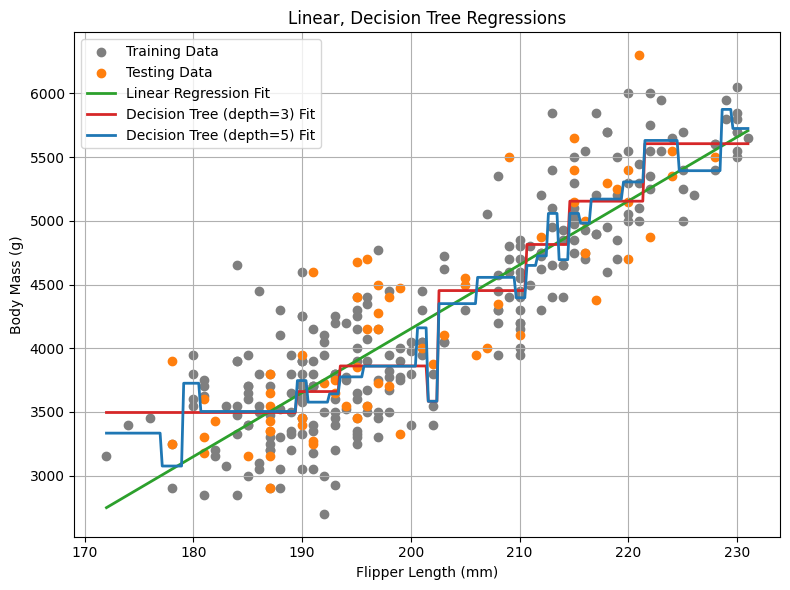

In [35]:
# using all predictions to plot regression curve

dt3_y_range_scaled = dt3_model.predict(X_range_scaled).flatten()
dt3_y_range = scaler_y.inverse_transform(dt3_y_range_scaled.reshape(-1, 1)).ravel()

dt5_y_range_scaled = dt5_model.predict(X_range_scaled).flatten()
dt5_y_range = scaler_y.inverse_transform(dt5_y_range_scaled.reshape(-1, 1)).ravel()


plt.figure(figsize=(8, 6))

plt.scatter(X_train_orig, y_train_orig, color="tab:gray", label="Training Data", alpha=1.0)
plt.scatter(X_test_orig, y_test_orig, color="tab:orange", label="Testing Data", alpha=1.0)

plt.plot(X_range, linear_y_range, color='tab:green', linewidth=2, label="Linear Regression Fit")
plt.plot(X_range, dt3_y_range, color='tab:red',  linewidth=2, label="Decision Tree (depth=3) Fit")
plt.plot(X_range, dt5_y_range, color='tab:blue', linewidth=2, label="Decision Tree (depth=5) Fit")

plt.xlabel("Flipper Length (mm)")
plt.ylabel("Body Mass (g)")
plt.title("Linear, Decision Tree Regressions")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()

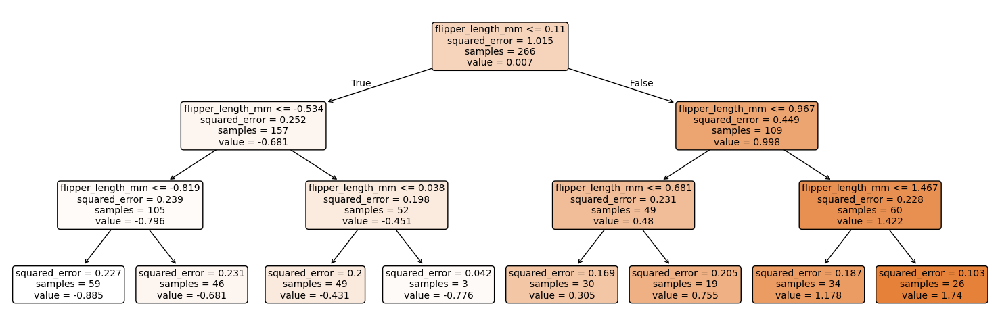

In [36]:
# plot decision tree structure

from sklearn.tree import plot_tree

plt.figure(figsize=(15, 5))
plot_tree(dt3_model, feature_names=["flipper_length_mm"], filled=True, rounded=True, fontsize=10)
plt.tight_layout()
plt.show()

When applying a Decision Tree Regressor to penguin regression tesk, tree depth plays a crucial role in shaping fitted curve.
- With a relatively shallow tree, such as `maxdepth = 3`, model makes only a few splits on flipper length, resulting in broad, step-like regions where body mass is predicted as average within each group.
	- This provides a coarse approximation of relationship, capturing general trend but missing finer variations.
- Increasing tree depth to `maxdepth = 5` allows for more splits, creating narrower regions and a fitted curve that follows data more closely.
	- While this improves flexibility and reduces bias, it also increases risk of capturing noise in training set, leading to overfitting.
- Comparing fitted curves at different depths illustrates **classic trade-off in decision trees: shallow trees may underfit, while deeper trees may fit training data too closely**.

### 6.2 Random Forest Regression

In [37]:
from sklearn.ensemble import RandomForestRegressor

rf5_model = RandomForestRegressor(n_estimators=100, max_depth=5, random_state=123)
rf5_model.fit(X_train_scaled, y_train_scaled)

rf5_y_pred_scaled = rf5_model.predict(X_test_scaled)
rf5_y_pred = scaler_y.inverse_transform(rf5_y_pred_scaled.reshape(-1, 1)).ravel()

rf5_rmse = root_mean_squared_error(y_test_orig, rf5_y_pred)
rf5_r2_value = r2_score(y_test_orig, rf5_y_pred)
print(f"Random Forest (depth=5) RMSE: {rf5_rmse:.2f}, R²: {rf5_r2_value:.2f}")

Random Forest (depth=5) RMSE: 425.48, R²: 0.70


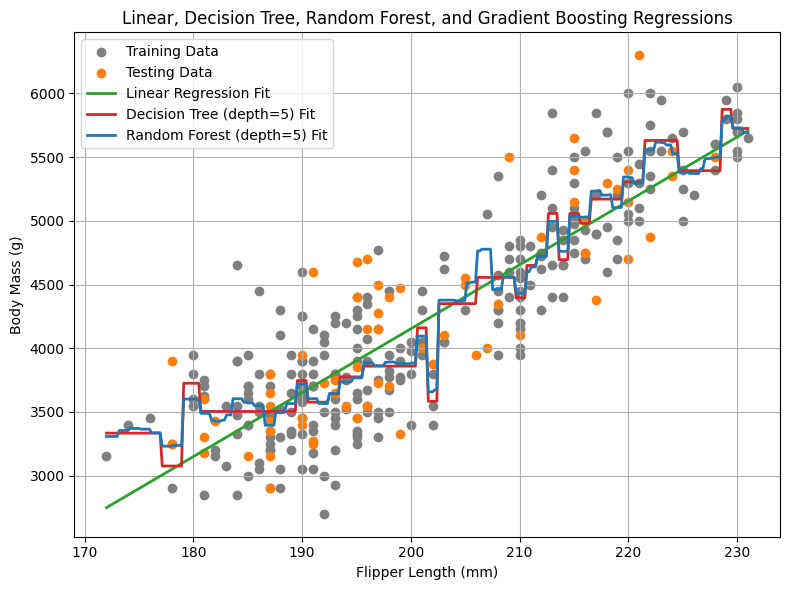

In [38]:
# using all predictions to plot regression curve

rf5_y_range_scaled = rf5_model.predict(X_range_scaled).flatten()
rf5_y_range = scaler_y.inverse_transform(rf5_y_range_scaled.reshape(-1, 1)).ravel()

plt.figure(figsize=(8, 6))

plt.scatter(X_train_orig, y_train_orig, color="tab:gray", label="Training Data", alpha=1.0)
plt.scatter(X_test_orig, y_test_orig, color="tab:orange", label="Testing Data", alpha=1.0)

plt.plot(X_range, linear_y_range, color='tab:green', linewidth=2, label="Linear Regression Fit")
plt.plot(X_range, dt5_y_range, color='tab:red', linewidth=2, label="Decision Tree (depth=5) Fit")
plt.plot(X_range, rf5_y_range, color='tab:blue', linewidth=2, label="Random Forest (depth=5) Fit")

plt.xlabel("Flipper Length (mm)")
plt.ylabel("Body Mass (g)")
plt.title("Linear, Decision Tree, Random Forest, and Gradient Boosting Regressions")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()

> In a Random Forest, we cannot all trees in the forest, it is applicable to plot individual decision trees inside the forest.

In [39]:
# a list of 100 DecisionTreeRegressor objects
rf5_model.estimators_

[DecisionTreeRegressor(max_depth=5, max_features=1.0, random_state=843828734),
 DecisionTreeRegressor(max_depth=5, max_features=1.0, random_state=914636141),
 DecisionTreeRegressor(max_depth=5, max_features=1.0, random_state=1228959102),
 DecisionTreeRegressor(max_depth=5, max_features=1.0, random_state=1840268610),
 DecisionTreeRegressor(max_depth=5, max_features=1.0, random_state=974319580),
 DecisionTreeRegressor(max_depth=5, max_features=1.0, random_state=819844194),
 DecisionTreeRegressor(max_depth=5, max_features=1.0, random_state=220395238),
 DecisionTreeRegressor(max_depth=5, max_features=1.0, random_state=941243409),
 DecisionTreeRegressor(max_depth=5, max_features=1.0, random_state=942612051),
 DecisionTreeRegressor(max_depth=5, max_features=1.0, random_state=2109339754),
 DecisionTreeRegressor(max_depth=5, max_features=1.0, random_state=1817228411),
 DecisionTreeRegressor(max_depth=5, max_features=1.0, random_state=1202710073),
 DecisionTreeRegressor(max_depth=5, max_feature

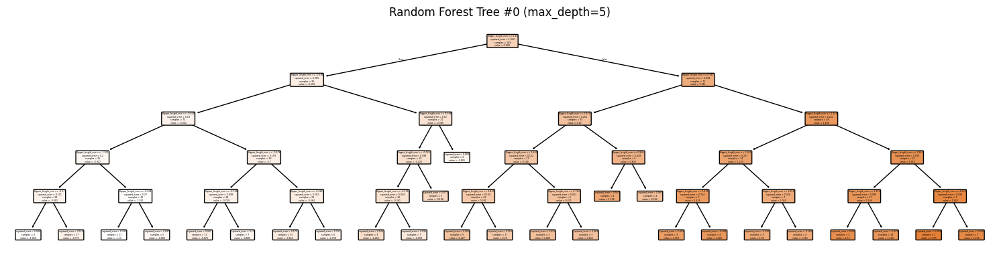

In [40]:
# plot one representative tree
tree_0 = rf5_model.estimators_[0]

plt.figure(figsize=(15, 4))
plot_tree(tree_0, filled=True, feature_names=["flipper_length_mm"], rounded=True)
plt.title("Random Forest Tree #0 (max_depth=5)")
plt.tight_layout()
plt.show()

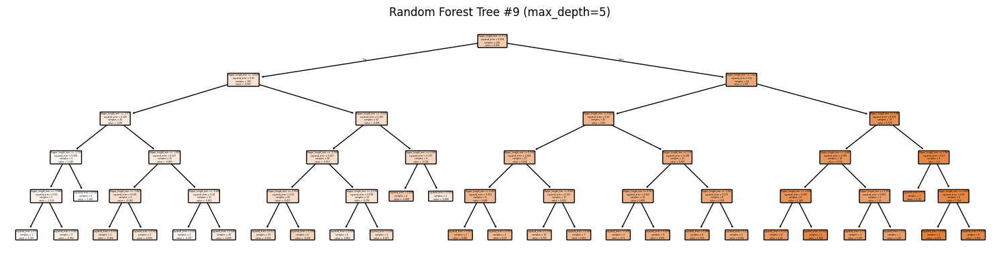

In [41]:
# plot one representative tree
tree_9 = rf5_model.estimators_[9]

plt.figure(figsize=(15, 4))
plot_tree(tree_9, filled=True, feature_names=["flipper_length_mm"], rounded=True)
plt.title("Random Forest Tree #9 (max_depth=5)")
plt.tight_layout()
plt.show()

### 6.3 Gradient Boosting Regression

In [42]:
from sklearn.ensemble import GradientBoostingRegressor

gb5_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=123)
gb5_model.fit(X_train_scaled, y_train_scaled)

gb5_y_pred_scaled = gb5_model.predict(X_test_scaled)
gb5_y_pred = scaler_y.inverse_transform(gb5_y_pred_scaled.reshape(-1, 1)).ravel()

gb5_rmse = root_mean_squared_error(y_test_orig, gb5_y_pred)
gb5_r2_value = r2_score(y_test_orig, gb5_y_pred)
print(f"Gradient Boosting (depth=5) RMSE: {gb5_rmse:.2f}, R²: {gb5_r2_value:.2f}")

Gradient Boosting (depth=5) RMSE: 441.01, R²: 0.68


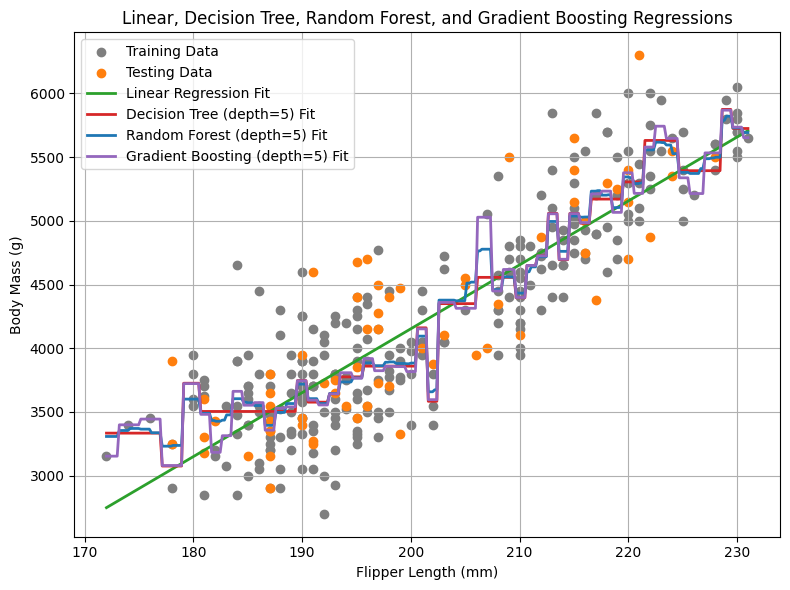

In [43]:
# using all predictions to plot regression curve

rf5_y_range_scaled = rf5_model.predict(X_range_scaled).flatten()
rf5_y_range = scaler_y.inverse_transform(rf5_y_range_scaled.reshape(-1, 1)).ravel()
 
gb5_y_range_scaled = gb5_model.predict(X_range_scaled).flatten()
gb5_y_range = scaler_y.inverse_transform(gb5_y_range_scaled.reshape(-1, 1)).ravel()

plt.figure(figsize=(8, 6))

plt.scatter(X_train_orig, y_train_orig, color="tab:gray", label="Training Data", alpha=1.0)
plt.scatter(X_test_orig, y_test_orig, color="tab:orange", label="Testing Data", alpha=1.0)

plt.plot(X_range, linear_y_range, color='tab:green', linewidth=2, label="Linear Regression Fit")
plt.plot(X_range, dt5_y_range, color='tab:red', linewidth=2, label="Decision Tree (depth=5) Fit")
plt.plot(X_range, rf5_y_range, color='tab:blue', linewidth=2, label="Random Forest (depth=5) Fit")
plt.plot(X_range, gb5_y_range, color='tab:purple', linewidth=2, label="Gradient Boosting (depth=5) Fit")

plt.xlabel("Flipper Length (mm)")
plt.ylabel("Body Mass (g)")
plt.title("Linear, Decision Tree, Random Forest, and Gradient Boosting Regressions")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()

In [44]:
print("\nComparison of RMSE and R² values:")
print(f"Linear Regression           RMSE: {linear_rmse:.2f}, R²: {linear_r2_value:.2f}")
print(f"Decision Tree     (depth=5) RMSE: {dt5_rmse:.2f}, R²: {dt5_r2_value:.2f}")
print(f"Random Forest     (depth=5) RMSE: {rf5_rmse:.2f}, R²: {rf5_r2_value:.2f}")
print(f"Gradient Boosting (depth=5) RMSE: {gb5_rmse:.2f}, R²: {gb5_r2_value:.2f}")


Comparison of RMSE and R² values:
Linear Regression           RMSE: 411.85, R²: 0.72
Decision Tree     (depth=5) RMSE: 424.83, R²: 0.70
Random Forest     (depth=5) RMSE: 425.48, R²: 0.70
Gradient Boosting (depth=5) RMSE: 441.01, R²: 0.68


In [45]:
# a list of 100 DecisionTreeRegressor objects
gb5_model.estimators_

array([[DecisionTreeRegressor(criterion='friedman_mse', max_depth=5,
                              random_state=RandomState(MT19937) at 0x174C1A69540)],
       [DecisionTreeRegressor(criterion='friedman_mse', max_depth=5,
                              random_state=RandomState(MT19937) at 0x174C1A69540)],
       [DecisionTreeRegressor(criterion='friedman_mse', max_depth=5,
                              random_state=RandomState(MT19937) at 0x174C1A69540)],
       [DecisionTreeRegressor(criterion='friedman_mse', max_depth=5,
                              random_state=RandomState(MT19937) at 0x174C1A69540)],
       [DecisionTreeRegressor(criterion='friedman_mse', max_depth=5,
                              random_state=RandomState(MT19937) at 0x174C1A69540)],
       [DecisionTreeRegressor(criterion='friedman_mse', max_depth=5,
                              random_state=RandomState(MT19937) at 0x174C1A69540)],
       [DecisionTreeRegressor(criterion='friedman_mse', max_depth=5,
             

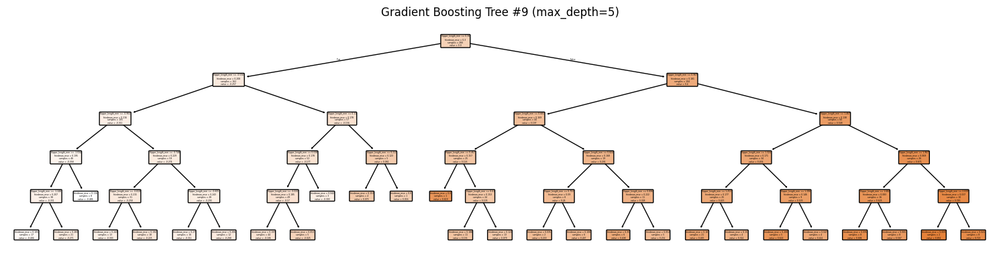

In [46]:
# plot one representative tree
# For `GradientBoostingRegressor`, each boosting stage adds one regression tree, and these trees are sequential, not independent.
tree_9 = gb5_model.estimators_[9][0]

plt.figure(figsize=(15, 4))
plot_tree(tree_9, filled=True, feature_names=["flipper_length_mm"], rounded=True)
plt.title("Gradient Boosting Tree #9 (max_depth=5)")
plt.tight_layout()
plt.show()

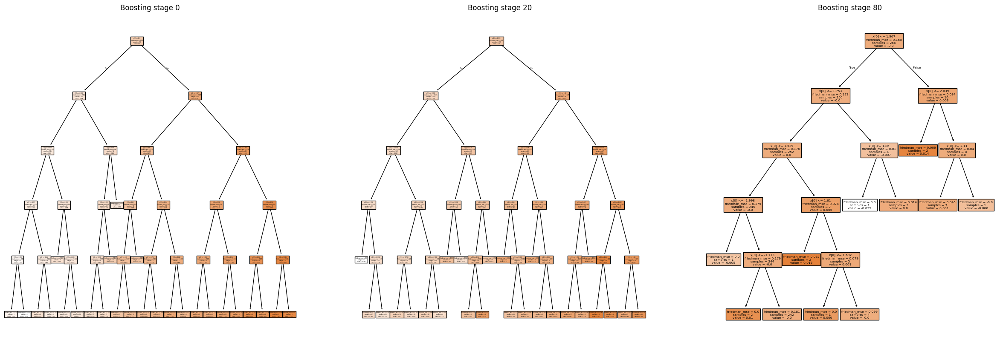

In [47]:
# plot trees from different boosting stages
# early trees are simple and coarse, later trees focus on residual errors

fig, axes = plt.subplots(1, 3, figsize=(30, 10))
for i, stage in enumerate([0, 20, 80]):
    plot_tree(
        gb5_model.estimators_[stage, 0],
        filled=True,
        ax=axes[i]
    )
    axes[i].set_title(f"Boosting stage {stage}")
plt.show()

## 7. Neural Network Models

For this penguins task, we will explore network implementations using three popular frameworks: user-friendly scikit-learn, high-level DL library Keras, and more granular, research-oriented PyTorch.

### 7.1 NN using Scikit-learn

In Scikit-learn, `MLPRegressor` class offers a convenient interface for training small- to medium-sized NNs, requiring minimal configuration while still providing flexibility for most regression tasks.

In [48]:
from sklearn.neural_network import MLPRegressor

mlp_model = MLPRegressor(hidden_layer_sizes=(32, 16, 8), activation='relu', 
                         solver='adam', max_iter=5000, random_state=123)
mlp_model.fit(X_train_scaled, y_train_scaled)

mlp_y_pred_scaled = mlp_model.predict(X_test_scaled)
mlp_y_pred = scaler_y.inverse_transform(mlp_y_pred_scaled.reshape(-1, 1)).ravel()

mlp_rmse = root_mean_squared_error(y_test_orig, mlp_y_pred)
mlp_r2_value = r2_score(y_test_orig, mlp_y_pred)
print(f"Multi-Layer Perceptron RMSE: {mlp_rmse:.2f}, R²: {mlp_r2_value:.2f}")

Multi-Layer Perceptron RMSE: 416.78, R²: 0.71


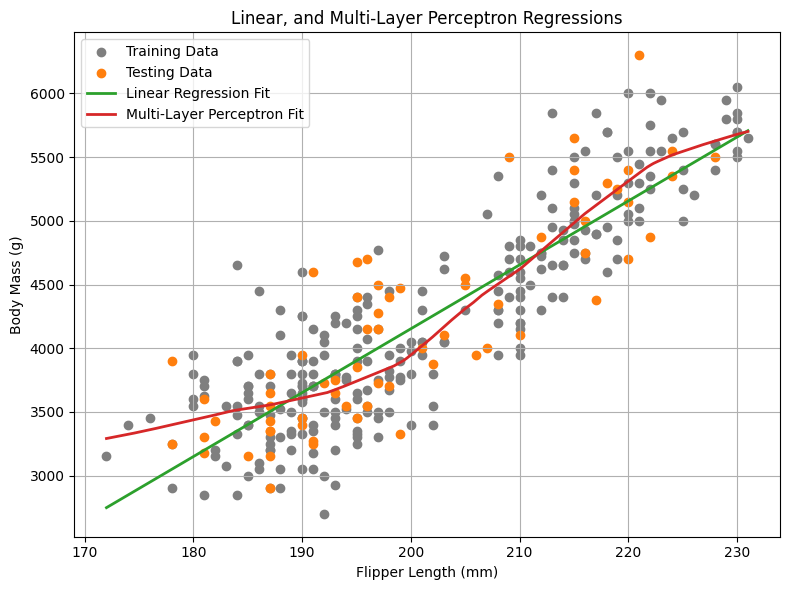

In [49]:
# using all predictions to plot regression curve

mlp_y_range_scaled = mlp_model.predict(X_range_scaled).flatten()
mlp_y_range = scaler_y.inverse_transform(mlp_y_range_scaled.reshape(-1, 1)).ravel()

plt.figure(figsize=(8, 6))

plt.scatter(X_train_orig, y_train_orig, color="tab:gray", label="Training Data", alpha=1.0)
plt.scatter(X_test_orig, y_test_orig, color="tab:orange", label="Testing Data", alpha=1.0)

plt.plot(X_range, linear_y_range, color='tab:green', linewidth=2, label="Linear Regression Fit")
plt.plot(X_range, mlp_y_range, color='tab:red', linewidth=2, label="Multi-Layer Perceptron Fit")

plt.xlabel("Flipper Length (mm)")
plt.ylabel("Body Mass (g)")
plt.title("Linear, and Multi-Layer Perceptron Regressions")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()

### 7.2 NN using Keras (TensorFlow)

For greater control and scalability, frameworks like Keras (built on TensorFlow) and PyTorch allow us to design custom NN architectures.
- We can specify number of hidden layers, number of neurons per layer, activation functions (*e.g.*, ReLU or tanh), and optimization algorithms (*e.g.*, stochastic gradient descent or Adam).
- These frameworks also offer tools for monitoring training, adjusting learning rates, and preventing overfitting through techniques such as regularization or dropout.

In [50]:
import tensorflow as tf
from tensorflow import keras

inputs = keras.Input(shape=(1,))
x = keras.layers.Dense(32, activation='relu')(inputs)
x = keras.layers.Dense(16, activation='relu')(x)
x = keras.layers.Dense(8, activation='relu')(x)
outputs = keras.layers.Dense(1)(x)

keras_model = keras.Model(inputs=inputs, outputs=outputs)
keras_model.compile(optimizer='adam', loss='mse')

In [51]:
class PrintEveryN(tf.keras.callbacks.Callback):
    def __init__(self, n=10):
        super().__init__()
        self.n = n

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.n == 0:
            print(f"Epoch {epoch+1}: loss={logs['loss']:.4f}, val_loss={logs['val_loss']:.4f}")

history = keras_model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=8,
    validation_split=0.2,
    verbose=0,  # turn off default output
    callbacks=[PrintEveryN(n=10)]  # print every 10 epochs
)

keras_y_pred_scaled = keras_model.predict(X_test_scaled)
keras_y_pred = scaler_y.inverse_transform(keras_y_pred_scaled.reshape(-1, 1)).ravel()

keras_rmse = root_mean_squared_error(y_test_orig, keras_y_pred)
keras_r2_value = r2_score(y_test_orig, keras_y_pred)
print(f"Neural Network (Keras) RMSE: {keras_rmse:.2f}, R²: {keras_r2_value:.2f}")

Epoch 10: loss=0.2066, val_loss=0.2072
Epoch 20: loss=0.2097, val_loss=0.2094
Epoch 30: loss=0.2077, val_loss=0.2075
Epoch 40: loss=0.2059, val_loss=0.2077
Epoch 50: loss=0.2100, val_loss=0.2185
Epoch 60: loss=0.2059, val_loss=0.2090
Epoch 70: loss=0.2058, val_loss=0.2046
Epoch 80: loss=0.2058, val_loss=0.2024
Epoch 90: loss=0.2066, val_loss=0.2092
Epoch 100: loss=0.2053, val_loss=0.2046
Epoch 110: loss=0.2053, val_loss=0.2042
Epoch 120: loss=0.2050, val_loss=0.2057
Epoch 130: loss=0.2046, val_loss=0.2051
Epoch 140: loss=0.2055, val_loss=0.2073
Epoch 150: loss=0.2056, val_loss=0.2054
Epoch 160: loss=0.2047, val_loss=0.2044
Epoch 170: loss=0.2059, val_loss=0.2067
Epoch 180: loss=0.2056, val_loss=0.2077
Epoch 190: loss=0.2041, val_loss=0.2063
Epoch 200: loss=0.2069, val_loss=0.2065
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Neural Network (Keras) RMSE: 414.89, R²: 0.72


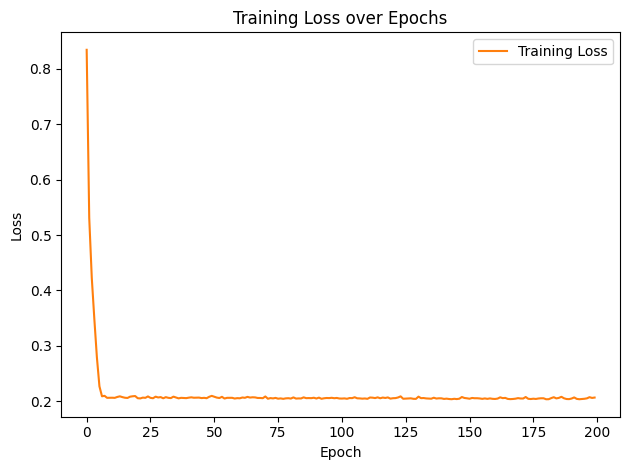

In [52]:
sns.lineplot(x=history.epoch, y=history.history['loss'], c="tab:orange", label='Training Loss')

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss over Epochs")
plt.legend()
plt.tight_layout()
plt.show()

### 7.3 NN using PyTorch

In [53]:
import torch
import torch.nn as nn

X = penguins_regression[["flipper_length_mm"]].values.astype(np.float32)
y = penguins_regression["body_mass_g"].values.astype(np.float32).reshape(-1, 1)

X_scaled = scaler_X.fit_transform(X)
y_scaled = scaler_y.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=123)

# convert to torch tensors
X_train_t = torch.tensor(X_train, dtype=torch.float32)
y_train_t = torch.tensor(y_train, dtype=torch.float32)
X_test_t = torch.tensor(X_test, dtype=torch.float32)
y_test_t = torch.tensor(y_test, dtype=torch.float32)

In [54]:
# define a NN model using PyTorch

class DNNRegressor(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(1, 32),
            nn.ReLU(),
            nn.Linear(32, 16),
            nn.ReLU(),
            nn.Linear(16, 8),
            nn.ReLU(),
            nn.Linear(8, 1)
        )
    def forward(self, x):
        return self.net(x)

pytorch_model = DNNRegressor()

# loss and optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(pytorch_model.parameters(), lr=0.001)

In [56]:
# training loop

epochs = 200
for epoch in range(epochs):
    pytorch_model.train()
    optimizer.zero_grad()
    outputs = pytorch_model(X_train_t)
    loss = criterion(outputs, y_train_t)
    loss.backward()
    optimizer.step()
    if (epoch+1) % 10 == 0:
        print(f"Epoch {epoch+1}/{epochs}, Loss: {loss.item():.4f}")

Epoch 10/200, Loss: 1.0125
Epoch 20/200, Loss: 0.9693
Epoch 30/200, Loss: 0.9047
Epoch 40/200, Loss: 0.8159
Epoch 50/200, Loss: 0.7108
Epoch 60/200, Loss: 0.5904
Epoch 70/200, Loss: 0.4620
Epoch 80/200, Loss: 0.3431
Epoch 90/200, Loss: 0.2576
Epoch 100/200, Loss: 0.2177
Epoch 110/200, Loss: 0.2074
Epoch 120/200, Loss: 0.2044
Epoch 130/200, Loss: 0.2028
Epoch 140/200, Loss: 0.2025
Epoch 150/200, Loss: 0.2023
Epoch 160/200, Loss: 0.2021
Epoch 170/200, Loss: 0.2020
Epoch 180/200, Loss: 0.2018
Epoch 190/200, Loss: 0.2017
Epoch 200/200, Loss: 0.2016


In [60]:
# evaluation

pytorch_model.eval()
with torch.no_grad():
    y_pred_t = pytorch_model(X_test_t).detach().cpu().numpy()
pytorch_y_pred = scaler_y.inverse_transform(y_pred_t)

# y_test_orig = scaler_y.inverse_transform(y_test)

pytorch_rmse = root_mean_squared_error(y_test_orig, pytorch_y_pred)
pytorch_r2_value = r2_score(y_test_orig, pytorch_y_pred)
print(f"Deep Neural Network (PyTorch) RMSE: {pytorch_rmse:.2f}, R²: {pytorch_r2_value:.2f}")

Deep Neural Network (PyTorch) RMSE: 416.43, R²: 0.71


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


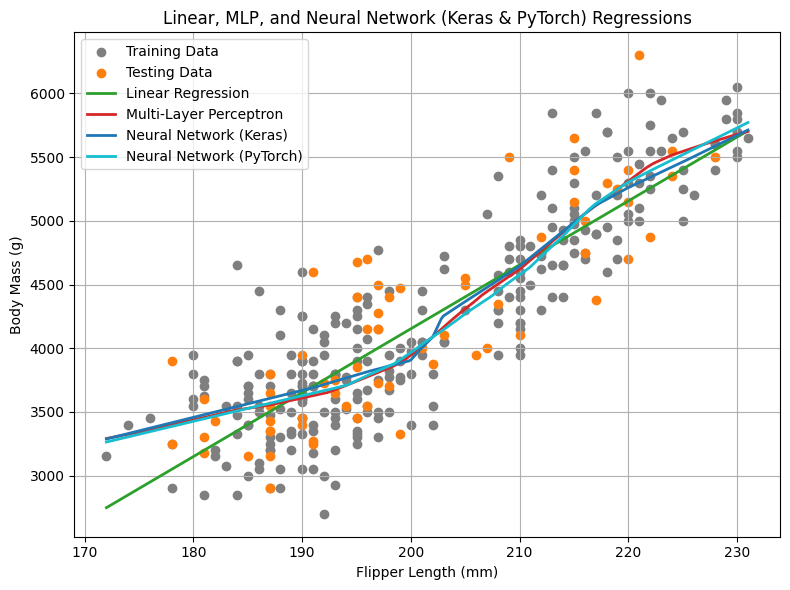

In [61]:
# using all predictions to plot regression curve

keras_y_range_scaled = keras_model.predict(X_range_scaled).flatten()
keras_y_range = scaler_y.inverse_transform(keras_y_range_scaled.reshape(-1, 1)).ravel()

X_range = np.linspace(X.min(), X.max(), 300).reshape(-1, 1).astype(np.float32)
X_range_scaled = scaler_X.transform(X_range)
X_range_t = torch.tensor(X_range_scaled, dtype=torch.float32)

with torch.no_grad():
    pytorch_y_range_scaled = pytorch_model(X_range_t).detach().cpu().numpy()
pytorch_y_range = scaler_y.inverse_transform(pytorch_y_range_scaled.reshape(-1, 1)).ravel()

plt.figure(figsize=(8, 6))

plt.scatter(X_train_orig, y_train_orig, color="tab:gray", label="Training Data", alpha=1.0)
plt.scatter(X_test_orig, y_test_orig, color="tab:orange", label="Testing Data", alpha=1.0)

plt.plot(X_range, linear_y_range, color='tab:green', linewidth=2, label="Linear Regression")
plt.plot(X_range, mlp_y_range, color='tab:red', linewidth=2, label="Multi-Layer Perceptron")
plt.plot(X_range, keras_y_range, color='tab:blue', linewidth=2, label="Neural Network (Keras)")
plt.plot(X_range, pytorch_y_range, color='tab:cyan', linewidth=2, label="Neural Network (PyTorch)")

plt.xlabel("Flipper Length (mm)")
plt.ylabel("Body Mass (g)")
plt.title("Linear, MLP, and Neural Network (Keras & PyTorch) Regressions")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()

## 8. Model Evaluation

### 8.1 Comparison of Trained Models

In [62]:
print("\nComparison of RMSE and R² values:")

print(f"k-Nearest Neighbors              RMSE: {knn_rmse:.2f},    R²: {knn_r2_value:.2f}")

print(f"Linear Regression                RMSE: {linear_rmse:.2f},    R²: {linear_r2_value:.2f}")
print(f"Regularized Regression (Ridge)   RMSE: {ridge_rmse:.2f},    R²: {ridge_r2_value:.2f}")
print(f"Regularized Regression (Lasso)   RMSE: {lasso_rmse:.2f},    R²: {lasso_r2_value:.2f}")

print(f"Polynomial Regression (degree=3) RMSE: {poly3_rmse:.2f},    R²: {poly3_r2_value:.2f}")
print(f"Polynomial Regression (degree=5) RMSE: {poly5_rmse:.2f},    R²: {poly5_r2_value:.2f}")

print(f"Support Vector Regression        RMSE: {svr_rmse:.2f},    R²: {svr_r2_value:.2f}")
print(f"Support Vector Regression (OPT)  RMSE: {svr_opt_rmse:.2f},    R²: {svr_opt_r2_value:.2f}")

print(f"Decision Tree (depth=3)          RMSE: {dt3_rmse:.2f},    R²: {dt3_r2_value:.2f}")
print(f"Decision Tree (depth=5)          RMSE: {dt5_rmse:.2f},    R²: {dt5_r2_value:.2f}")
print(f"Random Forest (depth=5)          RMSE: {rf5_rmse:.2f},    R²: {rf5_r2_value:.2f}")
print(f"Gradient Boosting (depth=5)      RMSE: {gb5_rmse:.2f},    R²: {gb5_r2_value:.2f}")

print(f"Multi-Layer Perceptron           RMSE: {mlp_rmse:.2f},    R²: {mlp_r2_value:.2f}")
print(f"Neural Network (Keras)           RMSE: {keras_rmse:.2f},    R²: {keras_r2_value:.2f}")
print(f"Neural Network (PyTorch)         RMSE: {pytorch_rmse:.2f},    R²: {pytorch_r2_value:.2f}")


Comparison of RMSE and R² values:
k-Nearest Neighbors              RMSE: 444.09,    R²: 0.68
Linear Regression                RMSE: 411.85,    R²: 0.72
Regularized Regression (Ridge)   RMSE: 414.18,    R²: 0.72
Regularized Regression (Lasso)   RMSE: 437.19,    R²: 0.69
Polynomial Regression (degree=3) RMSE: 407.47,    R²: 0.73
Polynomial Regression (degree=5) RMSE: 415.55,    R²: 0.72
Support Vector Regression        RMSE: 433.30,    R²: 0.69
Support Vector Regression (OPT)  RMSE: 421.54,    R²: 0.71
Decision Tree (depth=3)          RMSE: 415.62,    R²: 0.72
Decision Tree (depth=5)          RMSE: 424.83,    R²: 0.70
Random Forest (depth=5)          RMSE: 425.48,    R²: 0.70
Gradient Boosting (depth=5)      RMSE: 441.01,    R²: 0.68
Multi-Layer Perceptron           RMSE: 416.78,    R²: 0.71
Neural Network (Keras)           RMSE: 414.89,    R²: 0.72
Neural Network (PyTorch)         RMSE: 416.43,    R²: 0.71


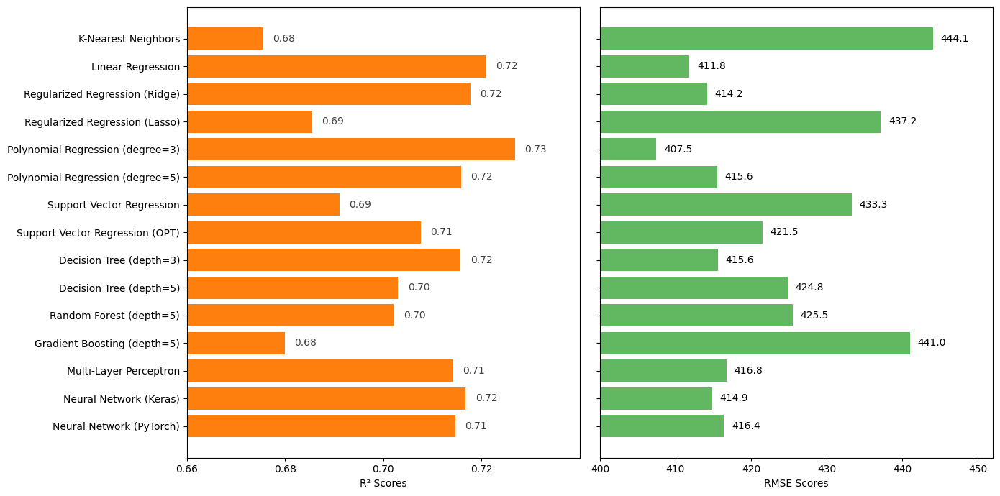

In [64]:
model_names = ["Neural Network (PyTorch)", "Neural Network (Keras)", "Multi-Layer Perceptron",
               "Gradient Boosting (depth=5)", "Random Forest (depth=5)", "Decision Tree (depth=5)", "Decision Tree (depth=3)",
               "Support Vector Regression (OPT)", "Support Vector Regression",
               "Polynomial Regression (degree=5)", "Polynomial Regression (degree=3)",
               "Regularized Regression (Lasso)", "Regularized Regression (Ridge)", "Linear Regression",
               "K-Nearest Neighbors"]
rmse_scores = [pytorch_rmse, keras_rmse, mlp_rmse, gb5_rmse, rf5_rmse, dt5_rmse, dt3_rmse,
               svr_opt_rmse, svr_rmse, poly5_rmse, poly3_rmse, lasso_rmse, ridge_rmse, linear_rmse, knn_rmse]
r2_scores = [pytorch_r2_value, keras_r2_value, mlp_r2_value, gb5_r2_value, rf5_r2_value, dt5_r2_value, dt3_r2_value,
               svr_opt_r2_value, svr_r2_value, poly5_r2_value, poly3_r2_value, lasso_r2_value, ridge_r2_value, linear_r2_value, knn_r2_value]

fig, axes = plt.subplots(1, 2, figsize=(14, 7), sharey=True)

# R² scores
axes[0].barh(model_names, r2_scores, color='tab:orange')
axes[0].set_xlabel("R² Scores")
axes[0].set_xlim(0.66, 0.74)
axes[0].set_xticks(np.arange(0.66, 0.74, 0.02))

for i, score in enumerate(r2_scores):
    axes[0].text(score + 0.002, i, f'{score:.2f}', va='center', alpha=0.75)

# RMSE scores
axes[1].barh(model_names, rmse_scores, color='tab:green', alpha=0.75)
axes[1].set_xlabel("RMSE Scores")
axes[1].set_xlim(400, 452)
axes[1].set_xticks(np.arange(400, 452, 10))

for i, score in enumerate(rmse_scores):
    axes[1].text(score + 1, i, f'{score:.1f}', va='center')

plt.tight_layout()
plt.show()

**Summary of regression models**
- Best performance: Polynomial Regression (degree=3) gave lowest RMSE (407.47) and highest R² (0.73), slightly outperforming Linear Regression.
- Strong performers: Linear Regression, Ridge, Polynomial Regression (degree=5), Decision Tree (depth=3), MLP, and Neural Networks (Keras, PyTorch) showed similar results (RMSE ≈ 412–415, R² ≈ 0.71–0.72).
- Moderate performers: Random Forest (depth=5), Decision Tree (depth=5), and SVR (optimized) performed decently (R² ≈ 0.70–0.72) but not better than simpler models.
- Weaker performers: Plain SVR, Lasso, Gradient Boosting, and KNN trailed behind with higher RMSEs (>430) and lower R² values (≈0.68–0.69).

### 8.2 Guidelines for models selection

For regression tasks, we experimented with a variety of models, including k-Nearest Neighbors (k-NN), linear models (Linear Regression, Ridge, Lasso), non-linear models (Polynomial Regression), margin-based models (SVM), tree-based models (Decision Tree, Random Forest, Gradient Boosting), and neural networks (MLPs/NNs). Choosing most suitable model depends on factors such as dataset size, feature relationships, interpretability, and computational requirements.
- 1. k-Nearest Neighbors (k-NN)
	- Works well on small datasets with smooth, local relationships between features and target.
	- Sensitive to high-dimensional data and noisy features.
	- Requires feature scaling, as distance metrics are scale-dependent.
	- Simple to implement but computationally expensive for large datasets.
- 2. Linear models (Linear Regression, Ridge, Lasso)
	- Linear Regression is interpretable and fast but only effective when relationship between features and target is approximately linear.
	- Ridge and Lasso add regularization to prevent overfitting and handle collinearity in features.
	- Ideal for baseline models or when interpretability is important.
- 3. Non-linear models (Polynomial Regression)
	- Can capture non-linear relationships by transforming features into polynomial terms.
	- Prone to overfitting if degree is too high.
	- Works best on small to medium datasets with known non-linear patterns.
- 4. Margin-based models (Support Vector Regression, SVR)
	- Captures complex non-linear relationships using kernels.
	- Effective on small to medium datasets, but computationally expensive for very large datasets.
	- Requires careful hyperparameter tuning (C, gamma, epsilon).
- 5. Tree-based models (Decision Tree, Random Forest, Gradient Boosting)
	- Decision Trees are interpretable but may overfit easily.
	- Random Forests reduce variance by averaging multiple trees, providing robustness and strong generalization.
	- Gradient Boosting (GBM, XGBoost, LightGBM) often achieves high predictive accuracy by sequentially learning residuals, though careful tuning is required to avoid overfitting.
	- Tree-based models are scale-invariant and can naturally handle both numerical and categorical features.
- 6. Neural Networks (MLPs/NNs)
	- Capable of modeling complex, highly non-linear relationships.
	- Require larger datasets and properly scaled inputs for effective training.
	- Less interpretable than tree-based models and more computationally intensive, often requiring GPU acceleration.

**Practical Recommendation**:
- For small datasets with simple relationships, linear models, k-NN, or SVR provide quick, interpretable baselines.
- For structured tabular data with non-linearities, Random Forests or Gradient Boosting regressors are usually preferred due to their robustness, strong predictive performance, and minimal preprocessing.
- Neural Networks are most suitable when dataset is large, relationships are highly complex, or when additional flexibility is required.

In general, tree-based ensemble methods like Random Forests and Gradient Boosting offer best trade-off between accuracy, robustness, and usability for most regression problems.

<div class='alert alert-info'>

:::{keypoints}
- We explored regression as a supervised learning task for predicting penguins body mass from their flipper length.
- Starting with simple models like Linear Regression, we gradually introduced more advanced approaches, including Polynomial Regression, Support Vector Regression, tree-based models, and neural networks.
- All models were evaluated using matrics including RMSE and R² scores, and visualized with predictive curves.
- Simple models (Linear and Polynomial Regression) performed as well as or better than complex models (SVR, trees, ensembles, neural network-based models).
- This indicates that the relationship between flipper length and body mass is mostly linear, with mild non-linear patterns.
:::
</div>